# Regret Heuristics

## Imports

In [14]:
import numpy as np
np.random.seed(42)
import pandas as pd
import math
import seaborn as sns
import random
random.seed(42)
import time

import matplotlib.pyplot as plt
import matplotlib.cm as cm

## Constants Declarations

In [15]:
TSPA_PATH = "../data/TSPA.csv"
TSPB_PATH = "../data/TSPB.csv"

## Read Data

In [16]:
df = pd.read_csv(TSPA_PATH, sep=";", header=None)
df.columns = ["x", "y", "val"]
df

,x,y,val
0,1355,1796,496
1,2524,387,414
2,2769,430,500
3,3131,1199,1133
4,661,87,903
...,...,...,...
195,189,1151,1145
196,3688,759,727
197,973,984,1637
198,910,1383,1255


## Utils

In [17]:
def math_round(n):
    '''
    Mathematically rounds up to the nearest integer, always rounds up for 0.5

    ParametersL
    n: floating point number to round
    '''
    if n - math.floor(n) < 0.5:
        return math.floor(n)
    return math.ceil(n)

In [18]:
def plot_nodes_with_lines(df, connections=None):
    """
    Plots nodes with optional lines connecting them, using a color scale to represent values.
    
    Parameters:
    df: DataFrame of nodes, each with 'x', 'y', and 'val'.
    connections: list of node indices in the DataFrame to connect in order.
    """
    plt.figure(figsize=(14, 7))
    norm = plt.Normalize(vmin=df.val.min(), vmax=df.val.max())
    colors = cm.Reds(norm(df.val))
    scatter = plt.scatter(df.x, df.y, c=df.val, cmap='Reds', s=100, edgecolors='black')

    if connections is not None:
        for start, end in zip(connections[:-1], connections[1:]):
            plt.plot([df.x[start], df.x[end]], [df.y[start], df.y[end]], color='blue')
        plt.plot([df.x[connections[-1]], df.x[connections[0]]], [df.y[connections[-1]], df.y[connections[0]]], color='blue')
    cbar = plt.colorbar(scatter)
    cbar.set_label('Node Cost')

    plt.xlabel('X')
    plt.ylabel('Y')
    title = 'Nodes with Color-Scaled Values' if connections is None else 'Nodes with Values and Connections'
    plt.title(title)
    plt.grid(False)
    plt.show()


def get_distance_matrix(df, distance_function):
    """
    Calculates the distance matrix for a set of nodes using the given distance function.

    Parameters:
    nodes: DataFrame of nodes, each with 'x', 'y', and 'val'.
    distance_function: function that takes two points (x1, y1) and (x2, y2) and returns the distance.

    Returns:
    A 2D numpy array representing the distance matrix.
    """
    positions = df[["x", "y"]]
    num_nodes = len(positions)
    distance_matrix = np.zeros((num_nodes, num_nodes), dtype=np.int64)

    for i in range(num_nodes):
        for j in range(i, num_nodes):
            dist = round(distance_function(positions.iloc[i], positions.iloc[j]))
            distance_matrix[i, j] = dist
            distance_matrix[j, i] = dist

    return distance_matrix


def calculate_score(solution, matrix, weights):
    '''
    Calculates solution score based on the matrix of distances and provided weights array.

    Parameters:
    solution: List or array of the solution
    matrix: Numpy array with node distances (2D)
    weights: Numpy array with node weights (1D - vector)
    '''
    score = 0
    for i in range(len(solution)-1):
        node_1 = solution[i]
        node_2 = solution[i+1]
        score += (matrix[node_1][node_2] + weights[node_1])
    node_1 = solution[-1]
    node_2 = solution[0]
    score += (matrix[node_1][node_2] + weights[node_1])
    return score

def euclidean_distance(point1, point2):
    return np.linalg.norm(point1 - point2)

In [19]:
def random_solution(distance_matrix, weights, start_node):
    '''
    Returns a random solution to the TSP problem based on the provided distance matrix.

    Parameters:
    distance_matrix: numpy.array containing distances between the nodes.
    weights: numpy.array containing the weights associated with each node.
    start_node: int, the index of the node from which the cycle starts.
    '''

    remaining_nodes = list(range(len(distance_matrix)))
    remaining_nodes.remove(start_node)
    np.random.shuffle(remaining_nodes)
    solution = [start_node] + remaining_nodes[:len(distance_matrix)//2 - 1]
    score = calculate_score(solution, distance_matrix, weights)
    return solution, score

In [20]:
distance_matrix = get_distance_matrix(df, euclidean_distance)
pd.DataFrame(distance_matrix)

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,0,1831,1966,1874,1845,1097,1658,2297,2193,1364,...,1977,746,1414,993,1527,1333,2553,897,607,1100
1,1831,0,249,1014,1887,1985,802,1872,1270,1027,...,2173,2104,2213,2215,1016,2457,1222,1662,1897,2600
2,1966,249,0,850,2136,2209,1050,1698,1066,981,...,2421,2301,2447,2426,1264,2679,976,1880,2089,2796
3,1874,1014,850,0,2709,2513,1715,858,344,512,...,2976,2442,2809,2632,1861,2942,710,2169,2229,2907
4,1845,1887,2136,2709,0,888,1091,3487,3036,2396,...,288,1352,780,1214,874,1164,3101,950,1320,1632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,1333,2457,2679,2942,1164,473,1834,3537,3286,2486,...,1087,587,384,342,1587,0,3521,802,757,523
196,2553,1222,976,710,3101,3068,2023,1124,517,1212,...,3384,3063,3338,3231,2227,3521,0,2724,2847,3545
197,897,1662,1880,2169,950,345,1113,2824,2513,1741,...,1085,529,649,563,890,802,2724,0,404,987
198,607,1897,2089,2229,1320,497,1462,2785,2569,1752,...,1409,216,807,419,1260,757,2847,404,0,708


In [21]:
weights = df.val.to_numpy()
weights[:2]

array([496, 414], dtype=int64)

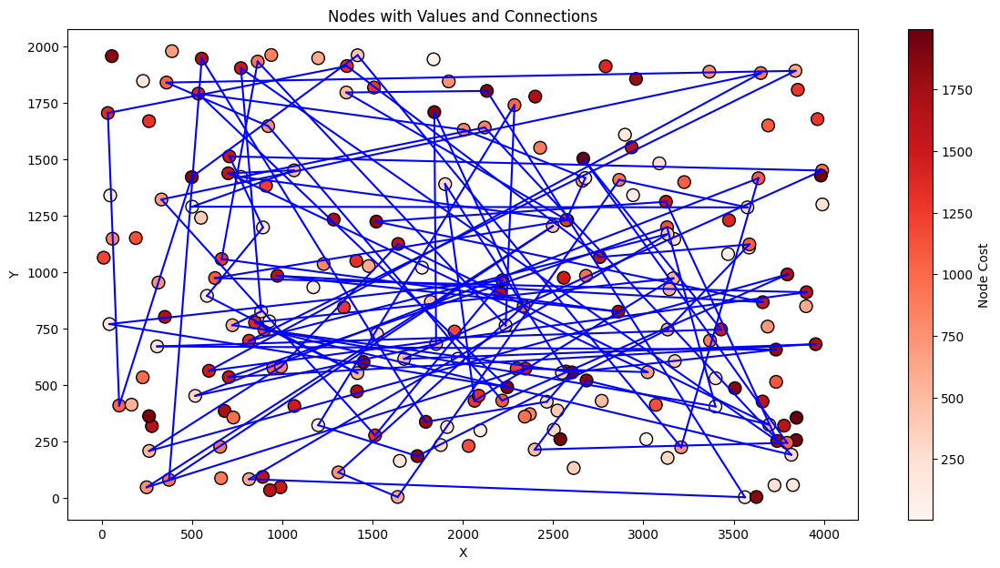

273509


In [22]:
start_solution, start_score = random_solution(distance_matrix, weights, start_node = 0)
plot_nodes_with_lines(df, start_solution)
print(start_score)

## Steepest Local Search Candidates

In [23]:
def node_inter_change_candidates(score, solution, solution_node_position, candidate_node, distance_matrix, weights, candidate_node_positions):
    score += weights[candidate_node]
    node = solution[solution_node_position]
    # Score for inserting the node after the solution_node_position node and deleting the next neighbor
    node_after = solution[solution_node_position+1]
    node_after_2 = solution[solution_node_position+2]
    score_after = score + distance_matrix[node][candidate_node] + \
                        distance_matrix[candidate_node][node_after_2] - \
                        distance_matrix[node][node_after] - \
                        distance_matrix[node_after][node_after_2]

    # Score for inserting the node before the solution_node_position node and deleting the previous neighbor
    node_before = solution[solution_node_position-1]
    node_before_2 = solution[solution_node_position-2]
    score_before = score + distance_matrix[node][candidate_node] + \
                        distance_matrix[candidate_node][node_before_2] - \
                        distance_matrix[node][node_before] - \
                        distance_matrix[node_before][node_before_2]

    temp_score = score_before if score_before < score_after else score_after

    if score_before < score_after:
        candidate_node_positions[solution[solution_node_position-1]] = -1
        candidate_node_positions[candidate_node] = solution_node_position-1
        
        solution[solution_node_position-1] = candidate_node
        
        return score_before, solution, candidate_node_positions

    candidate_node_positions[solution[solution_node_position+1]] = -1
    candidate_node_positions[candidate_node] = solution_node_position+1
    
    solution[solution_node_position+1] = candidate_node
    return score_after, solution, candidate_node_positions

def edge_intra_change_candidates(score, solution, solution_node_position, candidate_node, distance_matrix, candidate_node_positions):
    pass
    # temp_score = score
    # temp_score = update_score_intra_edge(temp_score, solution, cycle_position, any_node_position, num_cycle_nodes, distance_matrix)
    # solution[cycle_position+1:any_node_position+1] = solution[cycle_position+1:any_node_position+1][::-1]

    # return temp_score, solution

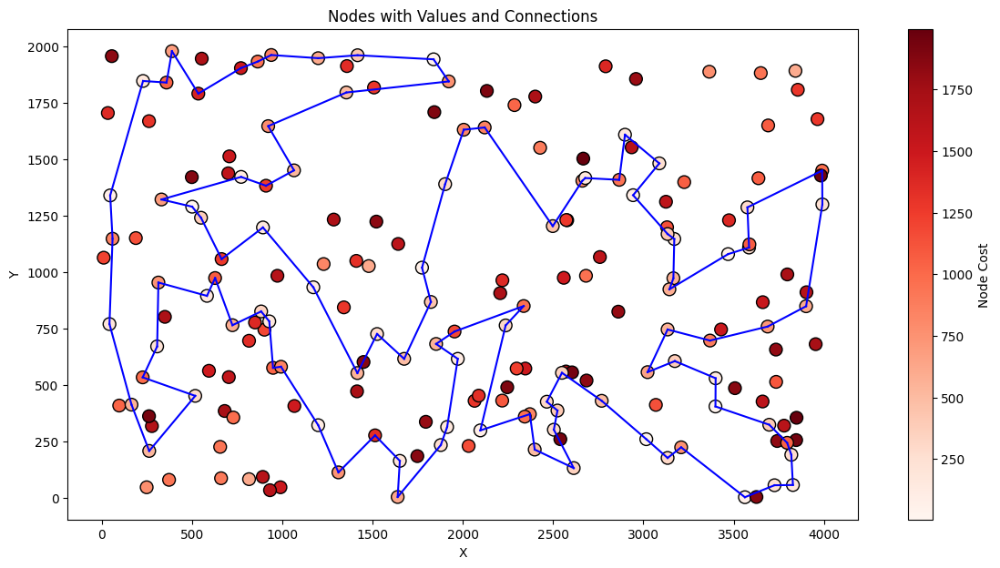

Achieved Total Score: 73902


In [27]:
def get_candidate_moves(node, d_matrix, weights, n_candidates = 10):
        node_distances = d_matrix[node] + weights
        candidate_moves = np.argsort(node_distances)
        candidate_moves = [n for n in candidate_moves][:n_candidates]
        return candidate_moves

def steepest_local_search_candidates(solution, score, distance_matrix, weights):
    # For each node get all candidates
    d_matrix = np.copy(distance_matrix)
    d_matrix = d_matrix.astype(np.float64)
    np.fill_diagonal(d_matrix, np.inf)

    num_cycle_nodes = len(solution)
    num_nodes = len(distance_matrix)
    node_candidates = {}
    for node in range(num_nodes):
        node_candidates[node] = get_candidate_moves(node, d_matrix, weights, 10)

    # Dict of positions of nodes in solution
    candidate_node_positions = dict([[node, pos] for node, pos in zip(solution, range(num_cycle_nodes))])

    # TODO Consider updating one solution as set representation for inter/intra checks
    improvement = True
    while improvement:
        improvement = False
        best_score = np.inf
        best_solution = None

        for solution_node_position in range(num_cycle_nodes):
            candidate_nodes = node_candidates[solution[solution_node_position]]
            for candidate_node in candidate_nodes:
                if candidate_node not in set(solution):
                    temp_score, temp_solution, temp_candidate_node_positions = \
                        node_inter_change_candidates(score, solution.copy(), solution_node_position, candidate_node, distance_matrix, weights, candidate_node_positions.copy())
                else:
                    # candidate_node_position can be achieved by keeping a dict of <node in solution : position in solution>
                    temp_score, temp_solution, temp_candidate_node_positions = \
                        edge_intra_change_candidates(score, solution.copy(), solution_node_position, candidate_node, distance_matrix, candidate_node_positions.copy())

                if temp_score < best_score:
                    best_score = temp_score
                    best_solution = temp_solution.copy()
                    best_temp_candidate_node_positions = temp_candidate_node_positions.copy()

        if best_score < score:
            score = best_score
            improvement = True
            solution = best_solution.copy()
            candidate_node_positions = best_temp_candidate_node_positions.copy()

    return solution, score

solution, score = steepest_local_search_candidates(start_solution.copy(), start_score.copy(), distance_matrix, weights)
plot_nodes_with_lines(df, solution)
print(f"Achieved Total Score: {score}")

In [5]:
solution = [5,6,3,2,4,8]
num_cycle_nodes = len(solution)
candidate_node_positions = dict([[node, pos] for node, pos in zip(solution, range(num_cycle_nodes))])
candidate_node_positions.get(10, -1)

-1

## Experiments

In [83]:
def test_algorithm(algorithm, distance_matrix, weights, local_algorithm = None):
    '''
    Tests chosen algorithm for each node.

    Parameters:
    local_algorithm: function of the local search
    algorithm: Function to test
    distance_matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing the weights associated with each node.
    num_runs: integer, number of tests per node (default: 200)
    '''
    all_nodes = [i for i in range(len(weights))]
    results = {}
    intermidiate_results = {}
    solutions = {}
    times = []
    for node in all_nodes:
        solution, score = algorithm(distance_matrix, weights, node)
        intermidiate_results[node] = score
        if local_algorithm is not None:
            start_time = time.time()
            solution, score = local_algorithm(solution, score, distance_matrix, weights)
            end_time = time.time()
            times.append(end_time - start_time)
        solutions[node] = solution
        results[node] = score
    return solutions, intermidiate_results, results, times

In [84]:
del df
del weights
del distance_matrix

### Instance A

In [85]:
df_A = pd.read_csv(TSPA_PATH, sep=";", header=None)
df_A.columns = ["x", "y", "val"]
distance_matrix_A = get_distance_matrix(df_A, euclidean_distance)
weights_A = df_A.val.to_numpy()

In [86]:
random_greedy_local_solution_A, random_greedy_local_intermidiate_A, random_greedy_local_result_A, random_greedy_local_times_A = test_algorithm(random_solution, distance_matrix_A, weights_A, local_algorithm = greedy_local_search)

In [87]:
random_steepest_solution_A, random_steepest_intermidiate_A, random_steepest_result_A, random_steepest_times_A = test_algorithm(random_solution, distance_matrix_A, weights_A, local_algorithm = steepest_local_search)

In [88]:
random_edge_greedy_local_solution_A, random_edge_greedy_local_intermidiate_A, random_edge_greedy_local_result_A, random_edge_greedy_local_times_A = test_algorithm(random_solution, distance_matrix_A, weights_A, local_algorithm = greedy_local_search_edges)

In [89]:
random_edge_steepest_local_solution_A, random_edge_steepest_local_intermidiate_A, random_edge_steepest_local_result_A, random_edge_steepest_local_times_A = test_algorithm(random_solution, distance_matrix_A, weights_A, local_algorithm = steepest_local_search_edges)

In [90]:
weighted_greedy_local_solution_A, weighted_greedy_local_intermidiate_A, weighted_greedy_local_result_A, weighted_greedy_local_times_A = test_algorithm(greedy_regret_cycle_weighted, distance_matrix_A, weights_A, local_algorithm = greedy_local_search)

In [91]:
weighted_steepest_solution_A, weighted_steepest_intermidiate_A, weighted_steepest_result_A, weighted_steepest_times_A = test_algorithm(greedy_regret_cycle_weighted, distance_matrix_A, weights_A, local_algorithm = steepest_local_search)

In [92]:
weighted_edges_greedy_local_solution_A, weighted_edges_greedy_local_intermidiate_A, weighted_edges_greedy_local_result_A, weighted_edges_greedy_local_times_A = test_algorithm(greedy_regret_cycle_weighted, distance_matrix_A, weights_A, local_algorithm = greedy_local_search_edges)

In [93]:
weighted_edges_steepest_local_solution_A, weighted_edges_steepest_local_intermidiate_A, weighted_edges_steepest_local_result_A, weighted_edges_steepest_local_times_A = test_algorithm(greedy_regret_cycle_weighted, distance_matrix_A, weights_A, local_algorithm = steepest_local_search_edges)

### Instance B

In [94]:
df_B = pd.read_csv(TSPB_PATH, sep=";", header=None)
df_B.columns = ["x", "y", "val"]
distance_matrix_B = get_distance_matrix(df_B, euclidean_distance)
weights_B = df_B.val.to_numpy()

In [95]:
random_greedy_local_solution_B, random_greedy_local_intermidiate_B, random_greedy_local_result_B, random_greedy_local_times_B = test_algorithm(random_solution, distance_matrix_B, weights_B, local_algorithm = greedy_local_search)

In [96]:
random_steepest_solution_B, random_steepest_intermidiate_B, random_steepest_result_B, random_steepest_times_B = test_algorithm(random_solution, distance_matrix_B, weights_B, local_algorithm = steepest_local_search)

In [97]:
random_edge_greedy_local_solution_B, random_edge_greedy_local_intermidiate_B, random_edge_greedy_local_result_B, random_edge_greedy_local_times_B = test_algorithm(random_solution, distance_matrix_B, weights_B, local_algorithm = greedy_local_search_edges)

In [98]:
random_edge_steepest_local_solution_B, random_edge_steepest_local_intermidiate_B, random_edge_steepest_local_result_B, random_edge_steepest_local_times_B = test_algorithm(random_solution, distance_matrix_B, weights_B, local_algorithm = steepest_local_search_edges)

In [99]:
nn_greedy_local_solution_B, nn_greedy_local_intermidiate_B, nn_greedy_local_result_B, nn_greedy_local_times_B = test_algorithm(nearest_neighbor_all, distance_matrix_B, weights_B, local_algorithm = greedy_local_search)

In [100]:
nn_steepest_solution_B, nn_steepest_intermidiate_B, nn_steepest_result_B, nn_steepest_times_B = test_algorithm(nearest_neighbor_all, distance_matrix_B, weights_B, local_algorithm = steepest_local_search)

In [101]:
nn_edges_greedy_local_solution_B, nn_edges_greedy_local_intermidiate_B, nn_edges_greedy_local_result_B, nn_edges_greedy_local_times_B = test_algorithm(nearest_neighbor_all, distance_matrix_B, weights_B, local_algorithm = greedy_local_search_edges)

In [102]:
nn_edges_steepest_local_solution_B, nn_edges_steepest_local_intermidiate_B, nn_edges_steepest_local_result_B, nn_edges_steepest_local_times_B = test_algorithm(nearest_neighbor_all, distance_matrix_B, weights_B, local_algorithm = steepest_local_search_edges)

## Results - Instance A

In [103]:
def plot_nodes_with_lines_and_score(df, score, connections=None):
    """
    Plots nodes with optional lines connecting them, using a color scale to represent values.
    
    Parameters:
    df: DataFrame of nodes, each with 'x', 'y', and 'val'.
    connections: list of node indices in the DataFrame to connect in order.
    """
    plt.figure(figsize=(14, 7))
    norm = plt.Normalize(vmin=df.val.min(), vmax=df.val.max())
    colors = cm.Reds(norm(df.val))
    scatter = plt.scatter(df.x, df.y, c=df.val, cmap='Reds', s=100, edgecolors='black')

    if connections is not None:
        for start, end in zip(connections[:-1], connections[1:]):
            plt.plot([df.x[start], df.x[end]], [df.y[start], df.y[end]], color='blue')
        plt.plot([df.x[connections[-1]], df.x[connections[0]]], [df.y[connections[-1]], df.y[connections[0]]], color='blue')
    cbar = plt.colorbar(scatter)
    cbar.set_label('Node Cost')

    plt.xlabel('X')
    plt.ylabel('Y')
    title = f'Nodes with Color-Scaled Values, Score: {score}' if connections is None else f'Nodes with Color-Scaled Values, Score: {score}'
    plt.title(title)
    plt.grid(False)
    plt.show()

def plot_score_distribution(score_dict, label, title, x_label):
    all_scores = []
    if type(score_dict) == dict:
        for key in score_dict.keys():
            item = score_dict[key]
            all_scores.append(item)
    else:
        all_scores = score_dict
    plt.hist(all_scores, bins=30, density=True, edgecolor='black', color="black", alpha=0.7)
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel('Relative Frequency')
    plt.show()

def plot_score_distributions(score_dict_1, score_dict_2, labels, title = 'Continuous Distribution of Scores Across Different Nodes', x_label = 'Score Value'):
    all_scores_1 = []
    for key in score_dict_1.keys():
        item = score_dict_1[key]
        all_scores_1.append(item)

    all_scores_2 = []
    for key in score_dict_2.keys():
        item = score_dict_2[key]
        all_scores_2.append(item)
    
    plt.figure(figsize=(10, 6))
    
    sns.kdeplot(all_scores_1, label=labels[0], color='black', linewidth=2)
    sns.kdeplot(all_scores_2, label=labels[1], color='red', linewidth=2)
    plt.xscale('log')
    
    # Add titles and labels
    plt.title(title, fontsize=14)
    plt.xlabel(x_label, fontsize=12)
    plt.ylabel('Density', fontsize=12)
    plt.legend(loc='upper right')
    plt.show()

In [104]:
def plot_best_overall(df, solutions, results):
    all_scores = []
    for key in results.keys():
        item = results[key]    
        all_scores.append(item)
    
    all_solutions = []
    for key in solutions.keys():
        item = solutions[key]
        all_solutions.append(item) 
    
    all_scores = np.array(all_scores)
    best_overall = np.argmin(all_scores)
    best_solution = all_solutions[best_overall]
    print("___________________________________________________________________")
    print(f"For Node: {best_overall}")
    plot_nodes_with_lines_and_score(df, all_scores[best_overall], best_solution)
    print(f"Best solution: {best_solution}")

def plot_average_overall(df, solutions, results):
    all_scores = []
    for key in results.keys():
        item = results[key]    
        all_scores.append(item)
    
    all_solutions = []
    for key in solutions.keys():
        item = solutions[key]
        all_solutions.append(item)

    all_scores = np.array(all_scores)
    median_index = np.argsort(all_scores)[len(all_scores) // 2]
    median_solution = all_solutions[median_index]
    
    print("___________________________________________________________________")
    print(f"For Node: {median_index}")
    plot_nodes_with_lines_and_score(df, all_scores[median_index], median_solution)

def plot_worst_overall(df, solutions, results):
    all_scores = []
    for key in results.keys():
        item = results[key]    
        all_scores.append(item)
    
    all_solutions = []
    for key in solutions.keys():
        item = solutions[key]
        all_solutions.append(item)
    
    all_scores = np.array(all_scores)
    best_overall = np.argmax(all_scores)
    best_solution = all_solutions[best_overall]
    print("___________________________________________________________________")
    print(f"For Node: {best_overall}")
    plot_nodes_with_lines_and_score(df, all_scores[best_overall], best_solution)


def calculate_stats_overall(results):
    all_scores = []
    if type(results) == dict:
        for key in results.keys():
            all_scores.append(results[key])
    else:
        all_scores = results
    all_scores = np.array(all_scores)
    min_value = np.min(all_scores)
    max_value = np.max(all_scores)
    median_value = np.median(all_scores)
    mean_value = np.mean(all_scores)
    std_deviation = np.std(all_scores)
    return min_value, max_value, median_value, mean_value, std_deviation


def plot_node(df, scores, solutions, node):
    score = scores[node]
    connections = solutions[node]
    print(f"Plotting Node: {node}")
    plot_nodes_with_lines_and_score(df, score, connections)

def compare_improvement(result, improved_result):
    initial_results = []
    improved_results = []
    for key in result:
        val = result[key]
        initial_results.append(val)
        val = improved_result[key]
        improved_results.append(val)
    initial_arr = np.array(initial_results)
    improved_arr = np.array(improved_results)
    differences = initial_arr - improved_arr
    min_val = np.min(differences)
    max_val = np.max(differences)
    mean = np.mean(differences)
    median = np.median(differences)
    std = np.std(differences)
    relative = np.mean(differences/initial_arr)
    return min_val, max_val, mean, median, std, relative

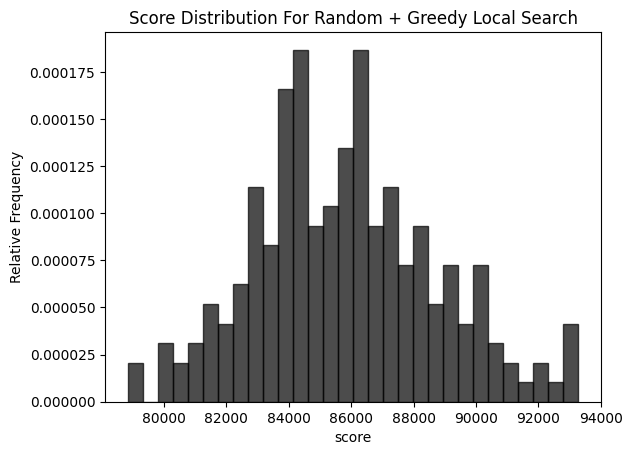

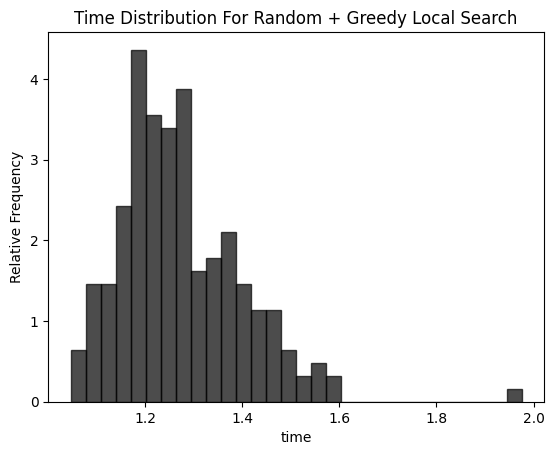

___________________________________________________________________
For Node: 54


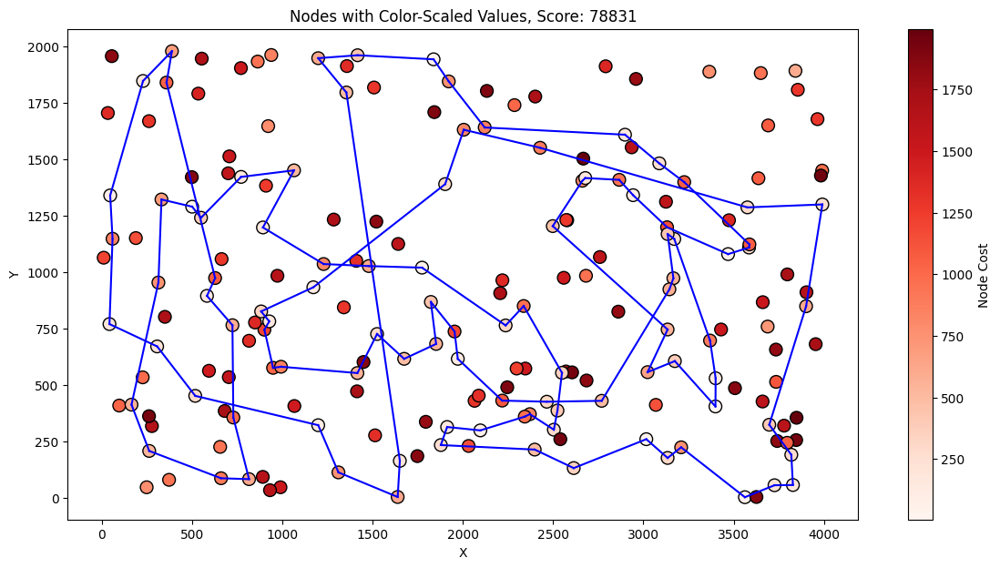

Best solution: [34, 146, 22, 18, 108, 69, 5, 42, 43, 35, 112, 4, 177, 54, 181, 159, 193, 41, 139, 46, 115, 118, 51, 176, 94, 124, 152, 1, 101, 26, 100, 53, 180, 154, 86, 75, 120, 44, 25, 16, 171, 175, 113, 31, 81, 90, 165, 15, 23, 137, 59, 116, 65, 47, 131, 149, 162, 151, 133, 79, 80, 122, 63, 121, 97, 2, 55, 52, 178, 106, 179, 145, 78, 92, 129, 57, 148, 9, 62, 102, 49, 3, 185, 40, 119, 138, 14, 144, 186, 89, 183, 143, 117, 0, 135, 70, 127, 123, 184, 160]
___________________________________________________________________
For Node: 53


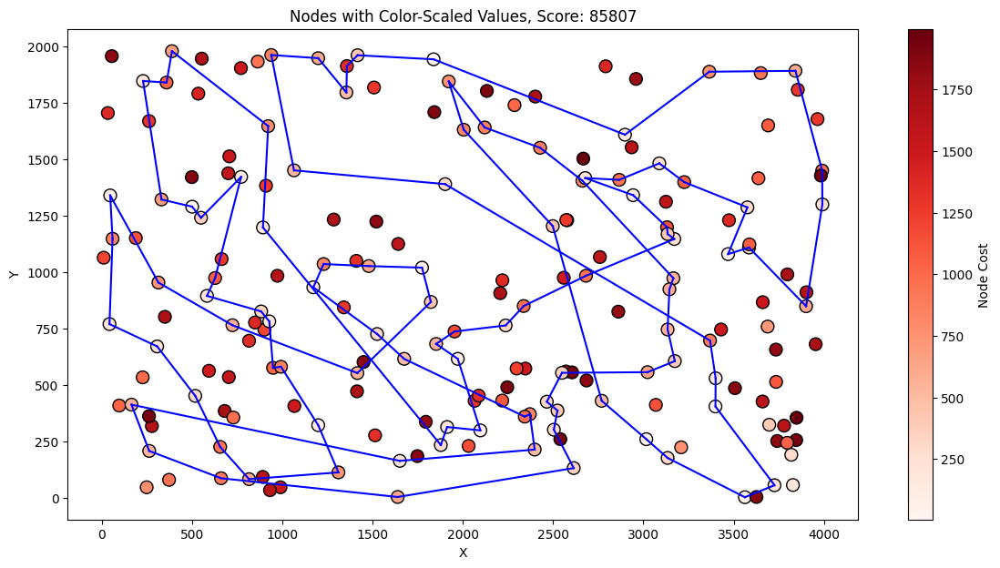

___________________________________________________________________
For Node: 49


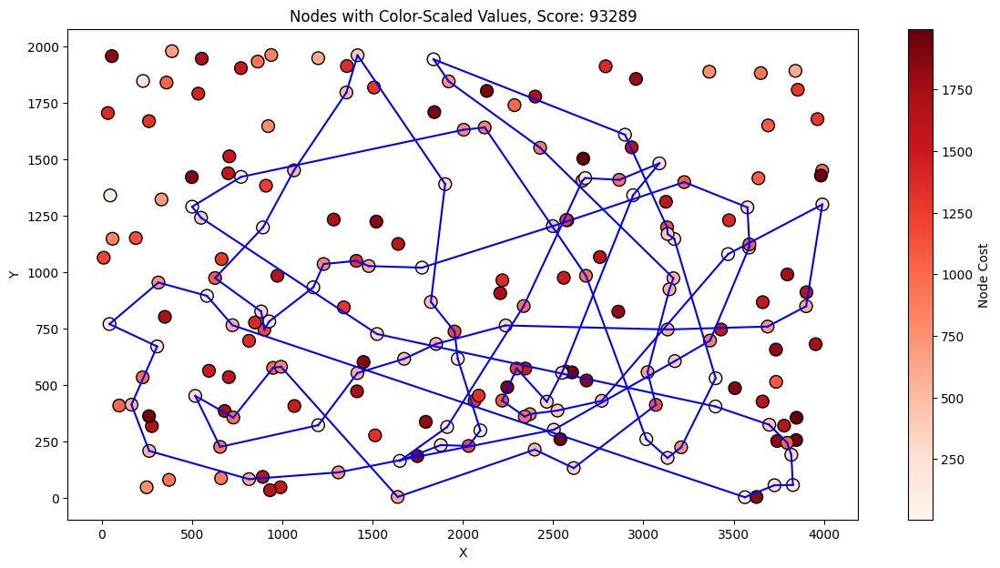

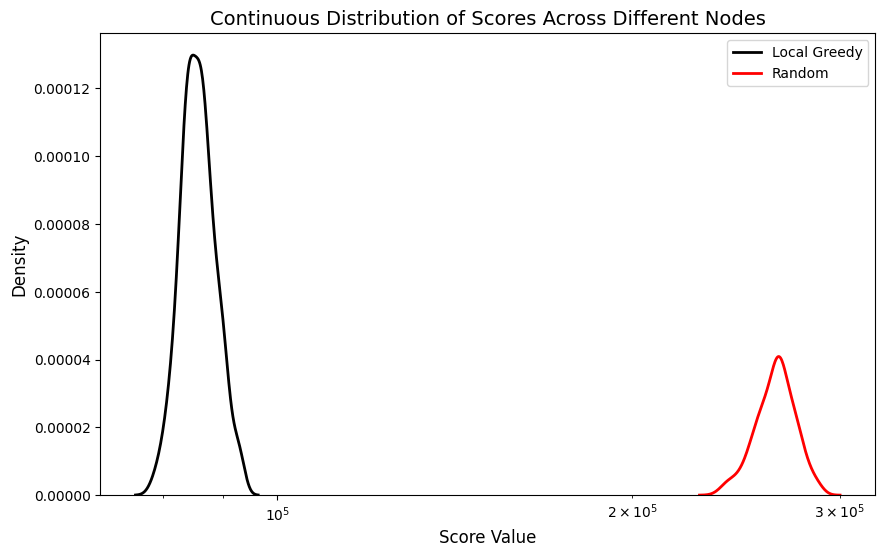

Overall Stats: 
 Minimum: 78831 Maximum: 93289 Median: 85805.0 Mean: 85811.825 Standard Deviation: 2903.954965968825
Time Stats: 
 Minimum: 1.0466172695159912 Maximum: 1.9752874374389648 Median: 1.2452713251113892 Mean: 1.2728523302078247 Standard Deviation: 0.12651291657849126
Comparison Stats: 
 Minimum: 153199 Maximum: 205327 Median: 179447.5 Mean: 179295.165 Standard Deviation: 10523.271392384357 and Relative: 0.6758335108166565


In [105]:
plot_score_distribution(random_greedy_local_result_A, label="Random + Greedy Local Search", title = "Score Distribution For Random + Greedy Local Search", x_label = "score")
plot_score_distribution(random_greedy_local_times_A, label="Times Random + Greedy Local Search", title = "Time Distribution For Random + Greedy Local Search", x_label = "time")
plot_best_overall(df_A, random_greedy_local_solution_A, random_greedy_local_result_A)
plot_average_overall(df_A, random_greedy_local_solution_A, random_greedy_local_result_A)
plot_worst_overall(df_A, random_greedy_local_solution_A, random_greedy_local_result_A)
plot_score_distributions(random_greedy_local_result_A, random_greedy_local_intermidiate_A, labels = ["Local Greedy", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_greedy_local_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_greedy_local_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(random_greedy_local_intermidiate_A, random_greedy_local_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

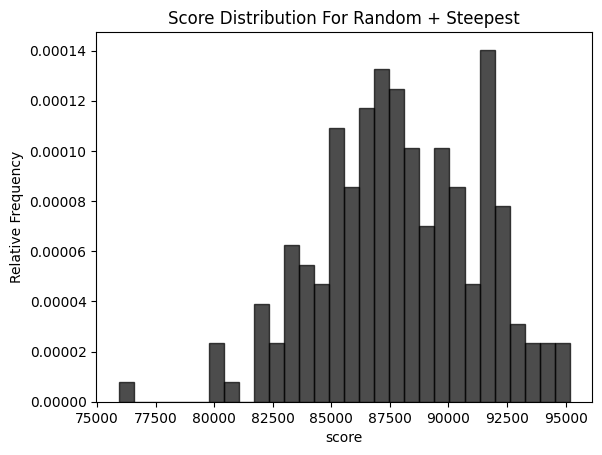

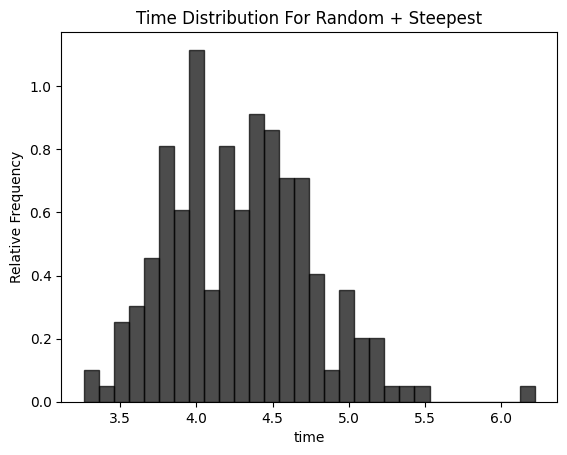

___________________________________________________________________
For Node: 57


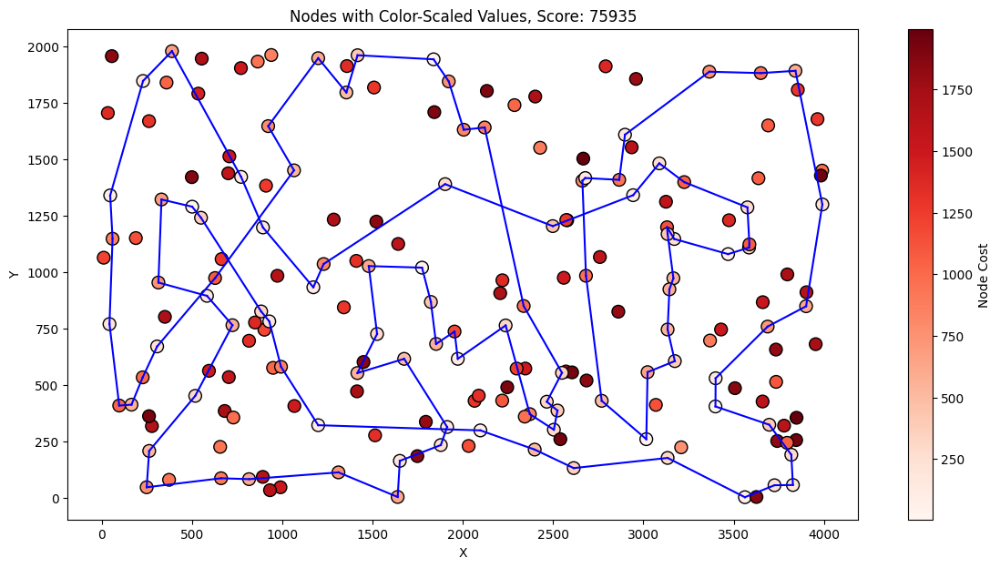

Best solution: [167, 2, 120, 129, 92, 57, 55, 52, 178, 3, 106, 185, 40, 119, 165, 138, 14, 49, 148, 137, 118, 59, 115, 139, 108, 18, 22, 146, 34, 30, 54, 48, 160, 5, 46, 68, 117, 0, 143, 183, 89, 23, 186, 124, 152, 97, 1, 101, 26, 94, 63, 122, 79, 80, 176, 51, 151, 162, 133, 180, 154, 135, 70, 127, 112, 4, 10, 177, 184, 43, 42, 181, 159, 193, 41, 116, 65, 149, 123, 53, 86, 75, 44, 16, 171, 175, 113, 31, 78, 145, 196, 81, 90, 164, 7, 21, 144, 102, 62, 9]
___________________________________________________________________
For Node: 100


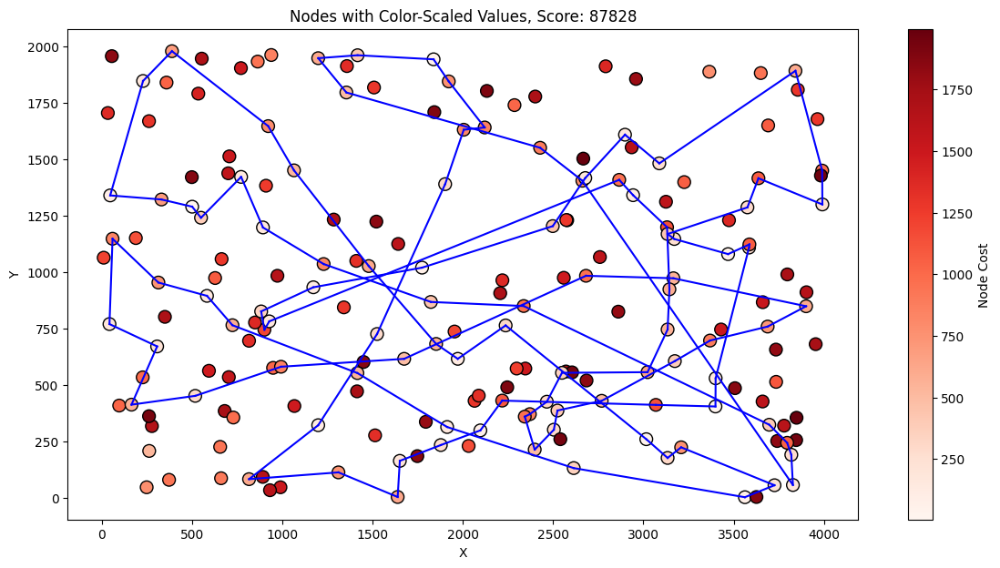

___________________________________________________________________
For Node: 80


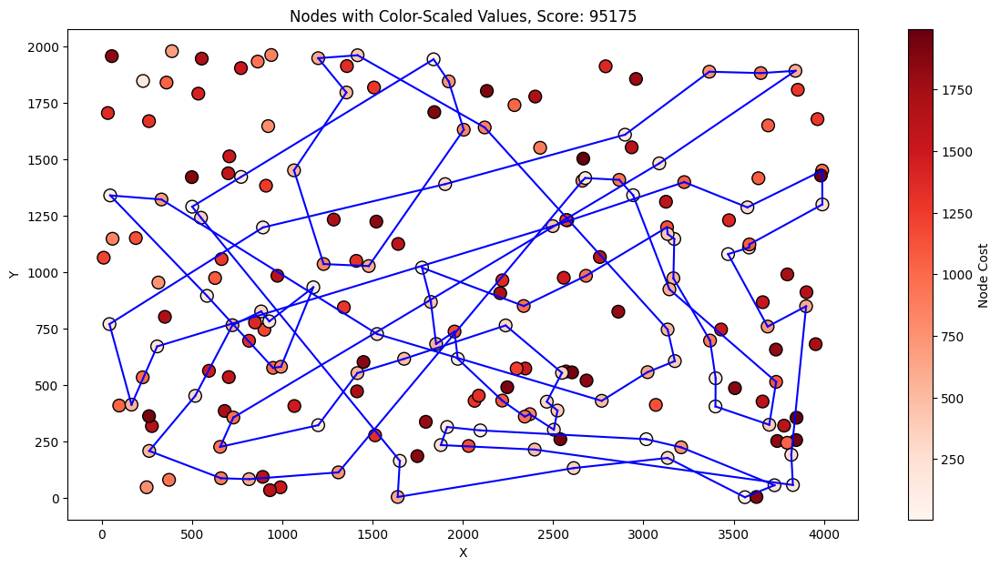

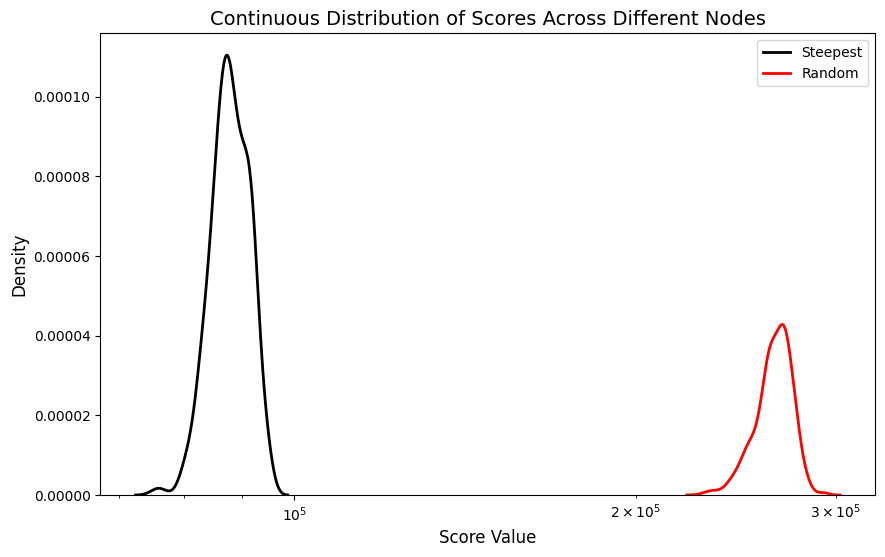

Overall Stats: 
 Minimum: 75935 Maximum: 95175 Median: 87819.5 Mean: 87935.42 Standard Deviation: 3343.8756800455367
Time Stats: 
 Minimum: 3.261320114135742 Maximum: 6.21825098991394 Median: 4.265605568885803 Mean: 4.283317213058472 Standard Deviation: 0.462567815516435
Comparison Stats: 
 Minimum: 138877 Maximum: 206044 Median: 177303.5 Mean: 177205.48 Standard Deviation: 10562.569496557171 and Relative: 0.6678345654443316


In [106]:
plot_score_distribution(random_steepest_result_A, label="Random + Steepest", title = "Score Distribution For Random + Steepest", x_label = "score")
plot_score_distribution(random_steepest_times_A, label="Times Random + Steepest", title = "Time Distribution For Random + Steepest", x_label = "time")
plot_best_overall(df_A, random_steepest_solution_A, random_steepest_result_A)
plot_average_overall(df_A, random_steepest_solution_A, random_steepest_result_A)
plot_worst_overall(df_A, random_steepest_solution_A, random_steepest_result_A)
plot_score_distributions(random_steepest_result_A, random_steepest_intermidiate_A, labels = ["Steepest", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_steepest_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_steepest_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(random_steepest_intermidiate_A, random_steepest_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

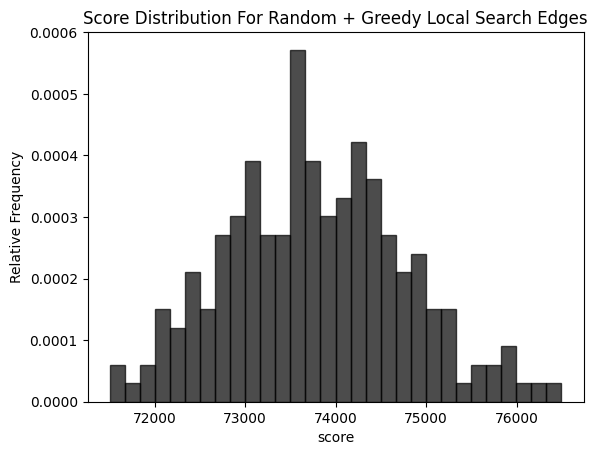

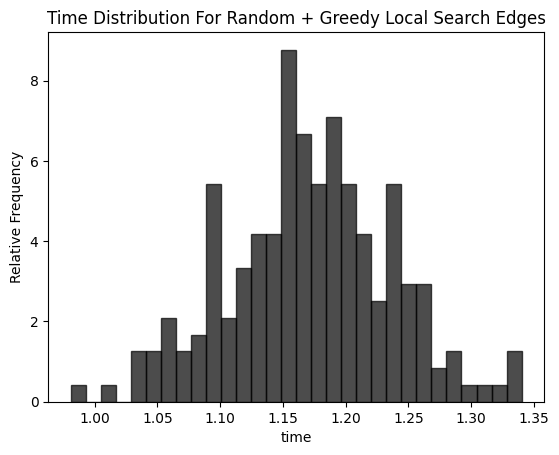

___________________________________________________________________
For Node: 24


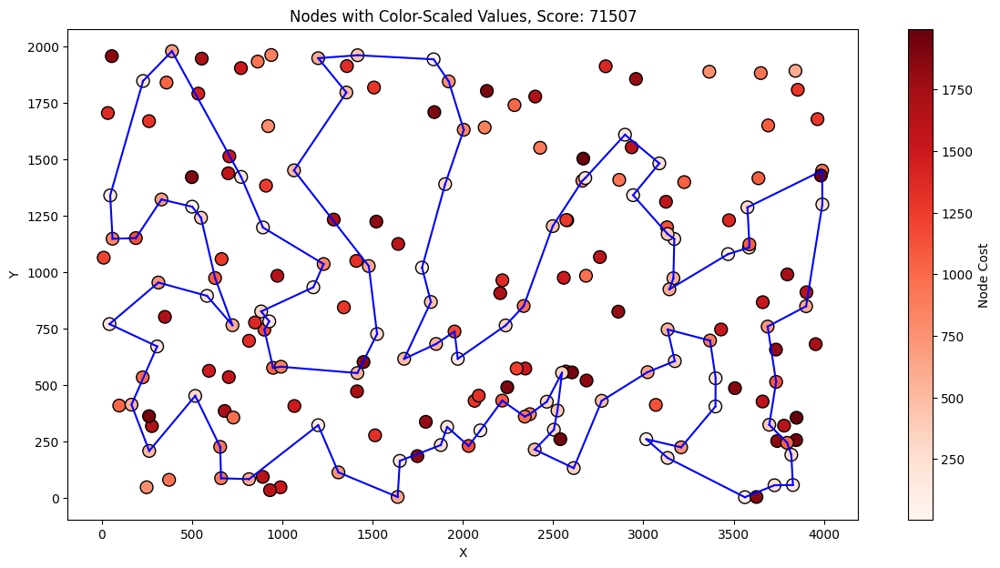

Best solution: [16, 44, 120, 25, 78, 145, 179, 57, 92, 129, 2, 75, 86, 101, 1, 152, 97, 26, 100, 121, 53, 158, 180, 154, 135, 70, 127, 123, 112, 4, 84, 184, 177, 54, 160, 34, 181, 42, 43, 5, 41, 193, 159, 195, 146, 22, 18, 108, 139, 115, 118, 59, 116, 65, 47, 131, 149, 162, 151, 51, 46, 0, 117, 143, 183, 89, 23, 137, 176, 80, 133, 79, 122, 63, 94, 124, 148, 9, 62, 144, 14, 49, 178, 106, 52, 55, 185, 40, 119, 165, 27, 90, 81, 196, 157, 31, 56, 113, 175, 171]
___________________________________________________________________
For Node: 95


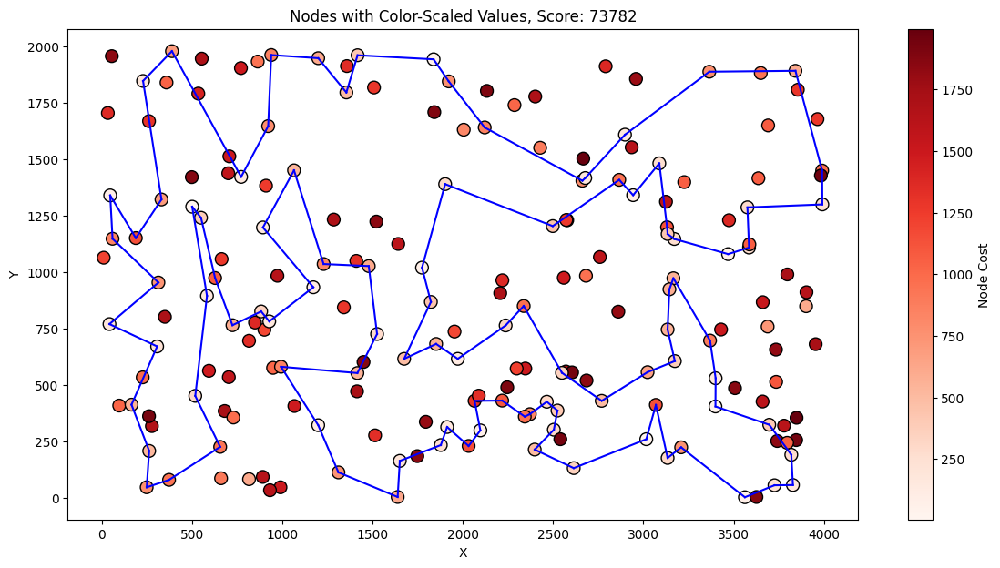

___________________________________________________________________
For Node: 102


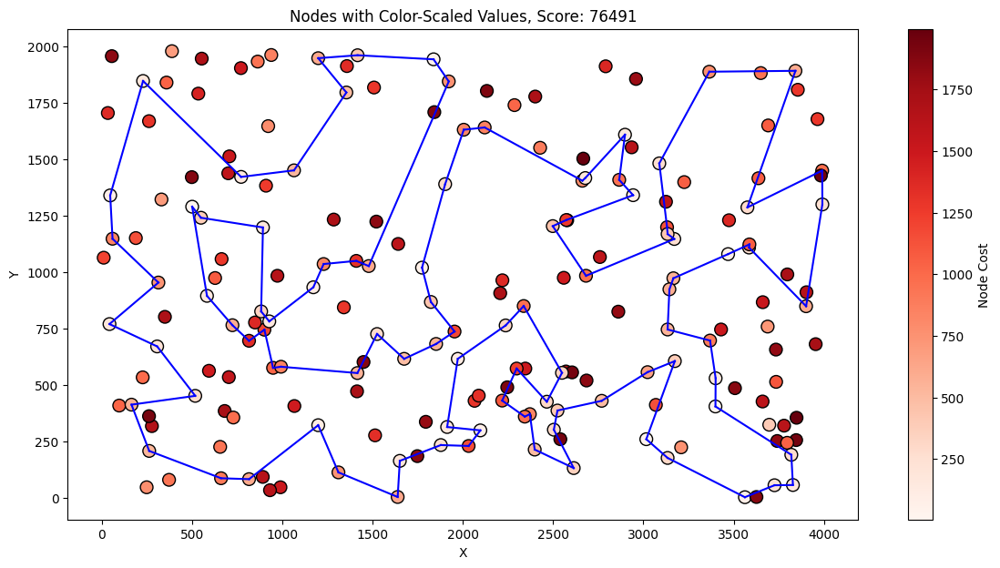

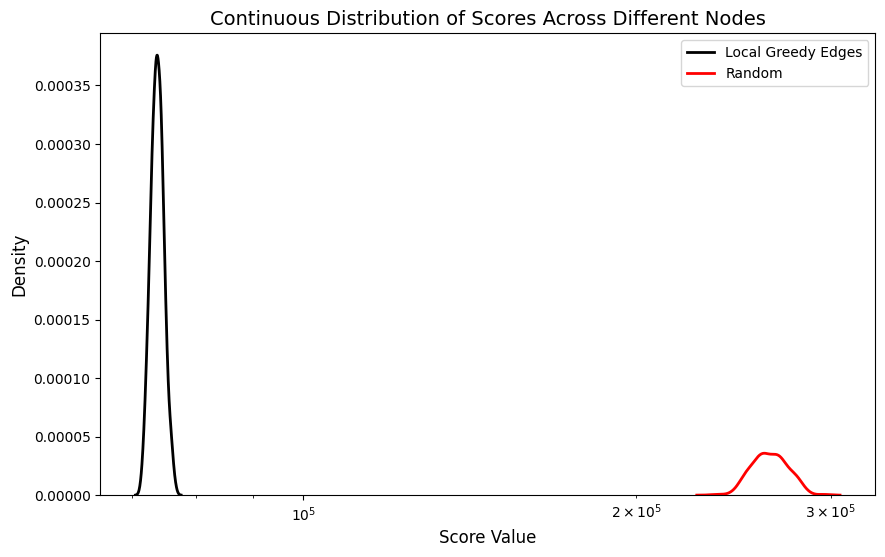

Overall Stats: 
 Minimum: 71507 Maximum: 76491 Median: 73782.0 Mean: 73780.845 Standard Deviation: 976.2576867687137
Time Stats: 
 Minimum: 0.9810178279876709 Maximum: 1.340083122253418 Median: 1.1698908805847168 Mean: 1.1707520115375518 Standard Deviation: 0.06504415795782235
Comparison Stats: 
 Minimum: 163391 Maximum: 223132 Median: 190748.5 Mean: 191034.415 Standard Deviation: 9661.495566566027 and Relative: 0.7210236347334746


In [107]:
plot_score_distribution(random_edge_greedy_local_result_A, label="Random + Greedy Local Search (Edges)", title = "Score Distribution For Random + Greedy Local Search Edges", x_label = "score")
plot_score_distribution(random_edge_greedy_local_times_A, label="Times Random + Greedy Local Search", title = "Time Distribution For Random + Greedy Local Search Edges", x_label = "time")
plot_best_overall(df_A, random_edge_greedy_local_solution_A, random_edge_greedy_local_result_A)
plot_average_overall(df_A, random_edge_greedy_local_solution_A, random_edge_greedy_local_result_A)
plot_worst_overall(df_A, random_edge_greedy_local_solution_A, random_edge_greedy_local_result_A)
plot_score_distributions(random_edge_greedy_local_result_A, random_edge_greedy_local_intermidiate_A, labels = ["Local Greedy Edges", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_edge_greedy_local_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_edge_greedy_local_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(random_edge_greedy_local_intermidiate_A, random_edge_greedy_local_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

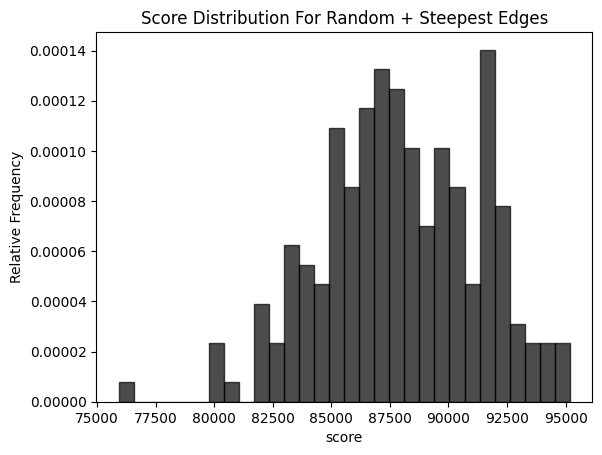

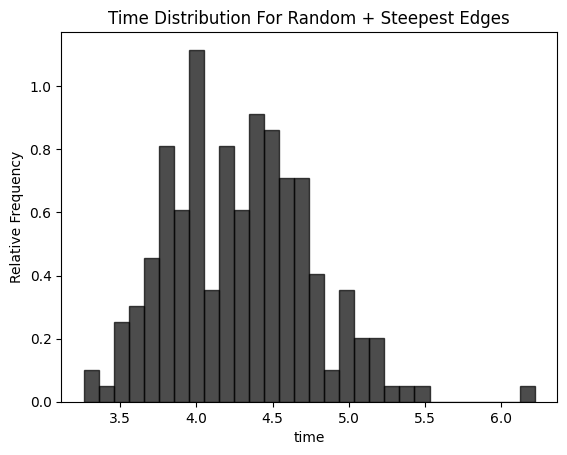

___________________________________________________________________
For Node: 4


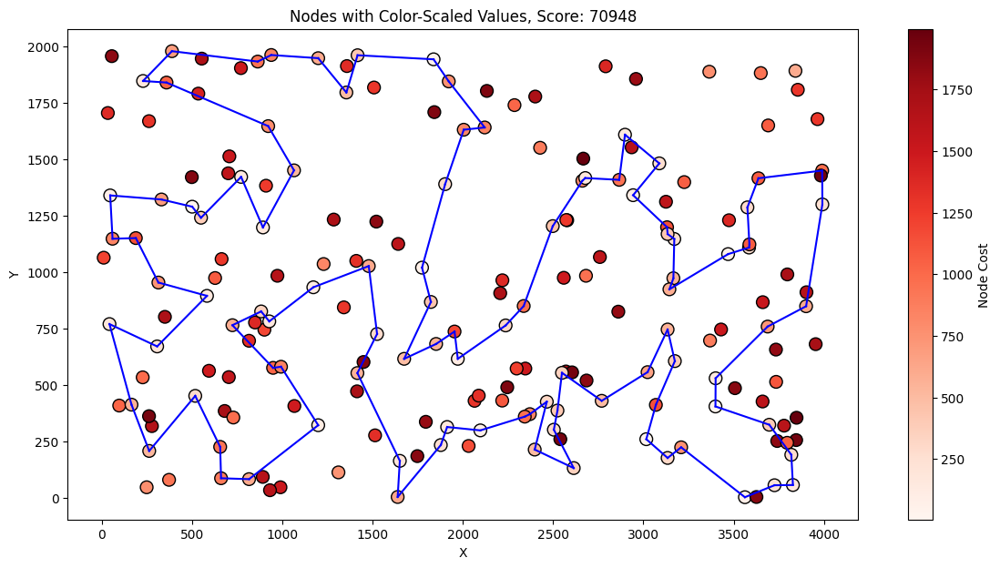

Best solution: [4, 84, 184, 177, 54, 34, 160, 42, 181, 195, 146, 22, 159, 193, 41, 139, 115, 46, 68, 69, 18, 108, 140, 93, 117, 0, 143, 183, 89, 186, 23, 137, 176, 80, 133, 79, 122, 63, 94, 124, 148, 9, 62, 102, 144, 14, 49, 3, 178, 106, 52, 55, 185, 40, 119, 165, 39, 27, 90, 81, 196, 145, 78, 31, 113, 175, 171, 16, 25, 44, 120, 82, 92, 57, 129, 2, 152, 1, 101, 75, 86, 97, 26, 100, 53, 180, 154, 70, 135, 162, 151, 51, 59, 65, 116, 43, 131, 149, 123, 112]
___________________________________________________________________
For Node: 87


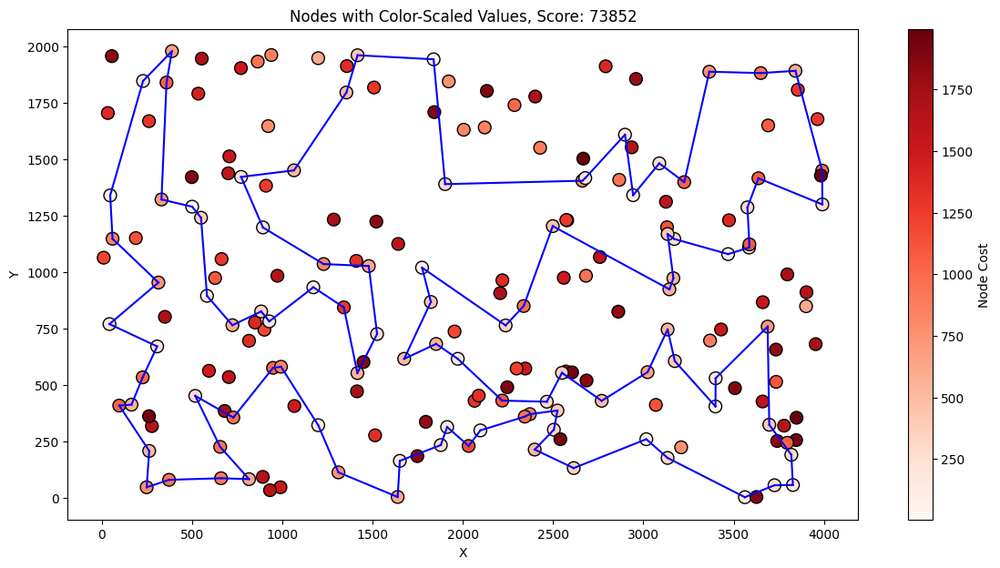

___________________________________________________________________
For Node: 131


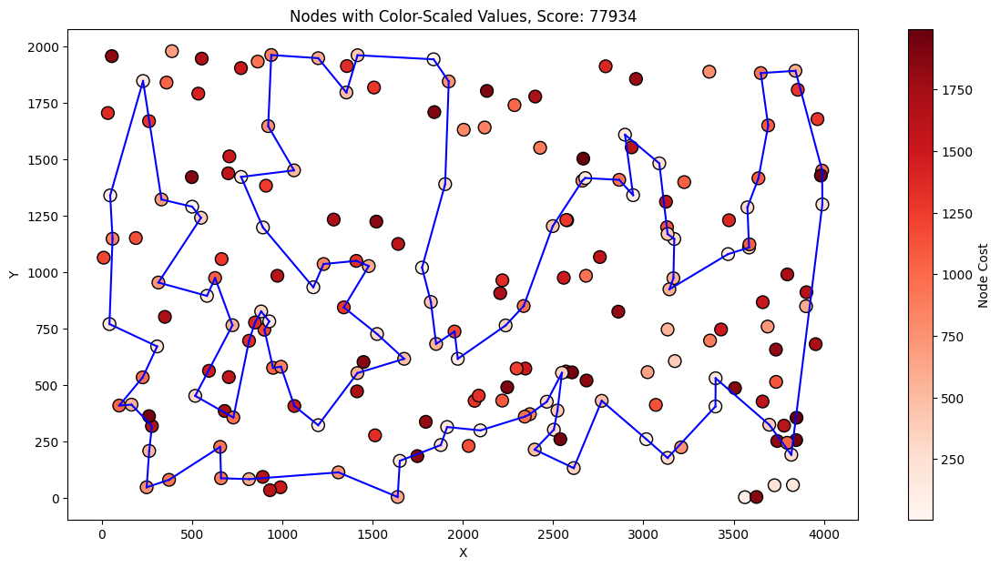

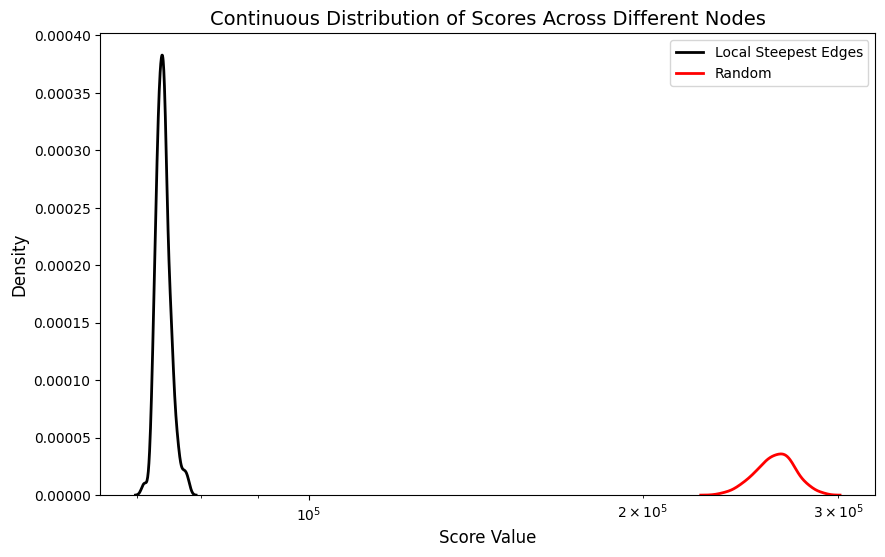

Overall Stats: 
 Minimum: 70948 Maximum: 77934 Median: 73848.0 Mean: 73954.31 Standard Deviation: 1129.2774477071612
Time Stats: 
 Minimum: 2.977938175201416 Maximum: 4.167880535125732 Median: 3.5447393655776978 Mean: 3.5705234932899477 Standard Deviation: 0.1949138915797767
Comparison Stats: 
 Minimum: 162483 Maximum: 216118 Median: 190592.0 Mean: 189875.445 Standard Deviation: 10374.86484668475 and Relative: 0.719270808302712


In [108]:
plot_score_distribution(random_steepest_result_A, label="Random + Steepest (Edges)", title = "Score Distribution For Random + Steepest Edges", x_label = "score")
plot_score_distribution(random_steepest_times_A, label="Times Random + Steepest (Edges)", title = "Time Distribution For Random + Steepest Edges", x_label = "time")
plot_best_overall(df_A, random_edge_steepest_local_solution_A, random_edge_steepest_local_result_A)
plot_average_overall(df_A, random_edge_steepest_local_solution_A, random_edge_steepest_local_result_A)
plot_worst_overall(df_A, random_edge_steepest_local_solution_A, random_edge_steepest_local_result_A)
plot_score_distributions(random_edge_steepest_local_result_A, random_edge_steepest_local_intermidiate_A, labels = ["Local Steepest Edges", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_edge_steepest_local_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_edge_steepest_local_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(random_edge_steepest_local_intermidiate_A, random_edge_steepest_local_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

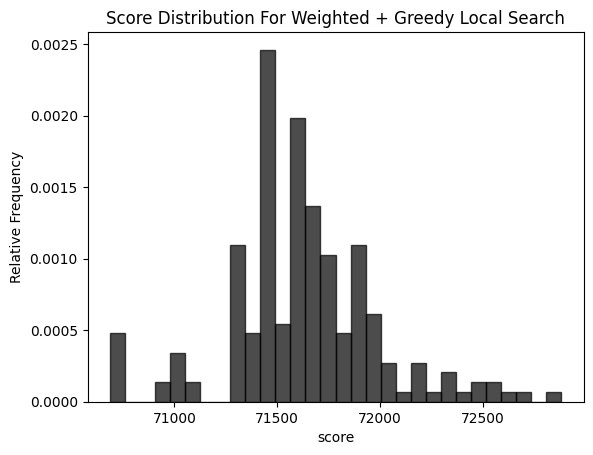

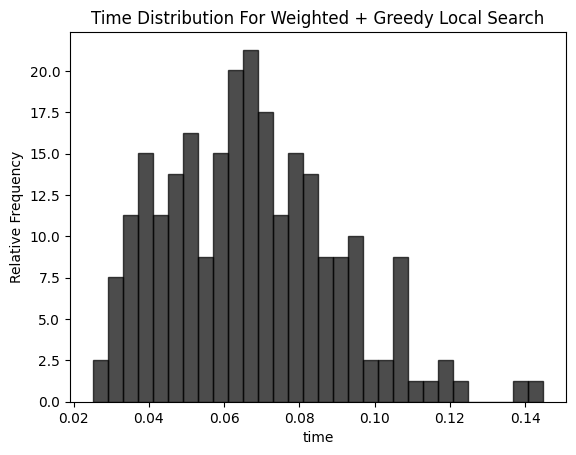

___________________________________________________________________
For Node: 0


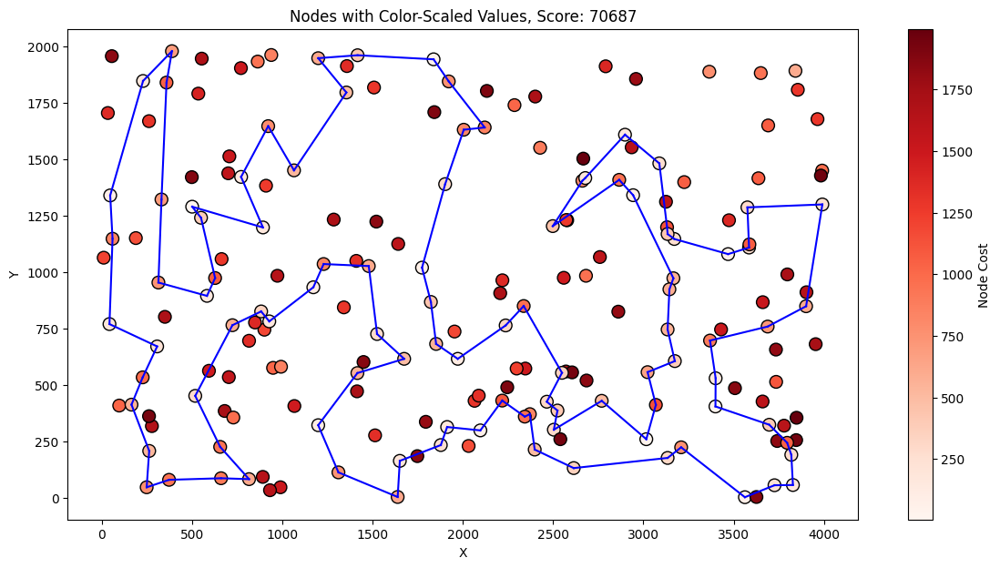

Best solution: [117, 0, 46, 68, 139, 115, 193, 41, 5, 42, 181, 159, 69, 108, 18, 22, 146, 34, 160, 48, 54, 177, 10, 190, 4, 112, 84, 184, 43, 116, 65, 59, 118, 51, 151, 133, 162, 123, 127, 70, 135, 154, 180, 53, 121, 100, 26, 86, 75, 44, 25, 16, 171, 175, 113, 56, 31, 78, 145, 179, 196, 81, 90, 165, 40, 185, 106, 178, 3, 14, 144, 62, 9, 148, 102, 49, 52, 55, 57, 92, 129, 82, 120, 2, 101, 1, 97, 152, 124, 94, 63, 79, 80, 176, 137, 23, 186, 89, 183, 143]
___________________________________________________________________
For Node: 30


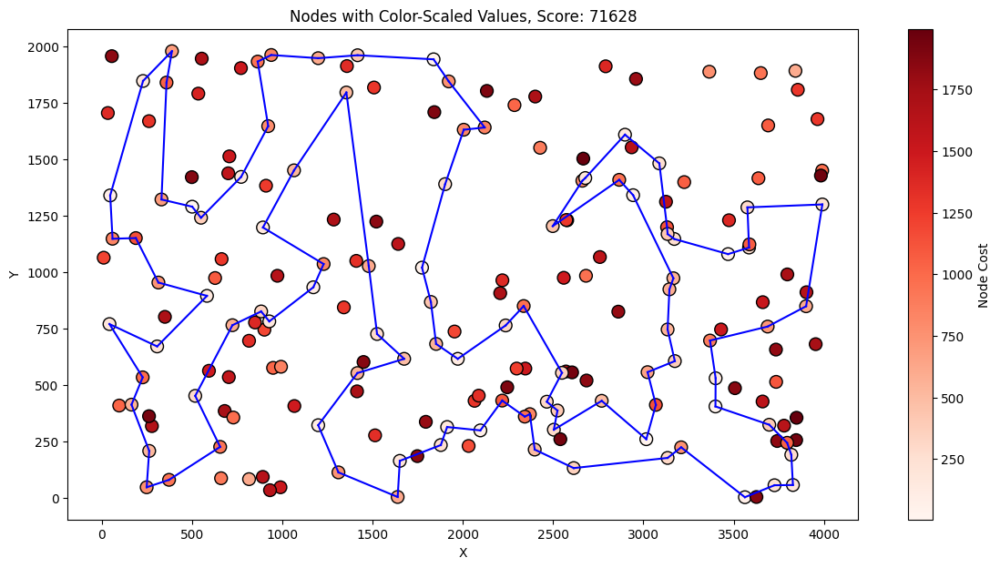

___________________________________________________________________
For Node: 17


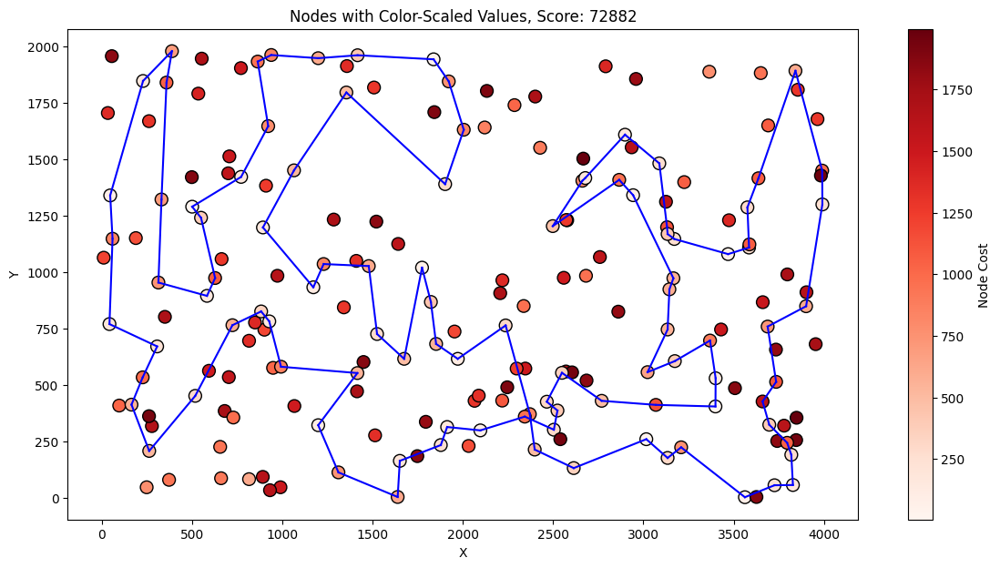

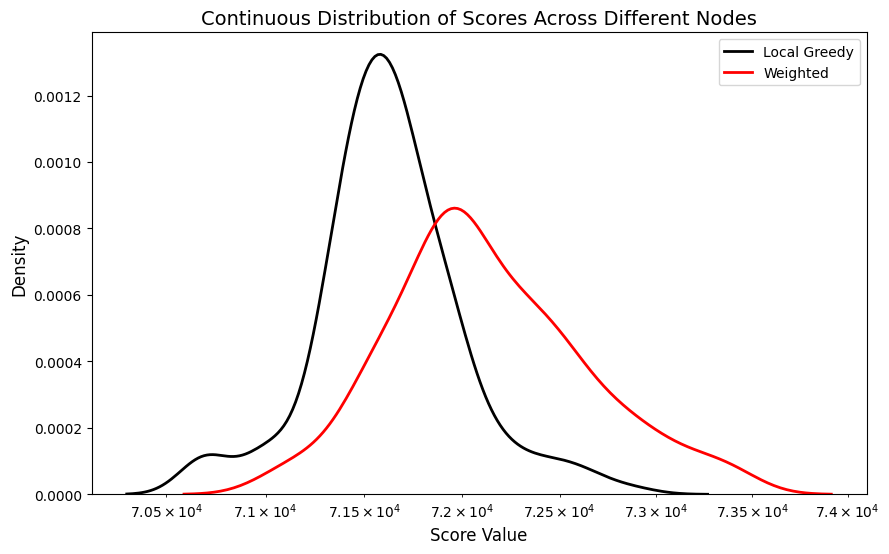

Overall Stats: 
 Minimum: 70687 Maximum: 72882 Median: 71628.0 Mean: 71627.42 Standard Deviation: 369.05348338689345
Time Stats: 
 Minimum: 0.025043487548828125 Maximum: 0.1448359489440918 Median: 0.0654982328414917 Mean: 0.06683804512023926 Standard Deviation: 0.022619029050154442
Comparison Stats: 
 Minimum: 7 Maximum: 1916 Median: 458.0 Mean: 505.365 Standard Deviation: 342.51952028315117 and Relative: 0.00698450056971804


In [109]:
plot_score_distribution(weighted_greedy_local_result_A, label="Weighted + Greedy Local Search", title = "Score Distribution For Weighted + Greedy Local Search", x_label = "score")
plot_score_distribution(weighted_greedy_local_times_A, label="Times Weighted + Greedy Local Search", title = "Time Distribution For Weighted + Greedy Local Search", x_label = "time")
plot_best_overall(df_A, weighted_greedy_local_solution_A, weighted_greedy_local_result_A)
plot_average_overall(df_A, weighted_greedy_local_solution_A, weighted_greedy_local_result_A)
plot_worst_overall(df_A, weighted_greedy_local_solution_A, weighted_greedy_local_result_A)
plot_score_distributions(weighted_greedy_local_result_A, weighted_greedy_local_intermidiate_A, labels = ["Local Greedy", "Weighted"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(weighted_greedy_local_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(weighted_greedy_local_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(weighted_greedy_local_intermidiate_A, weighted_greedy_local_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

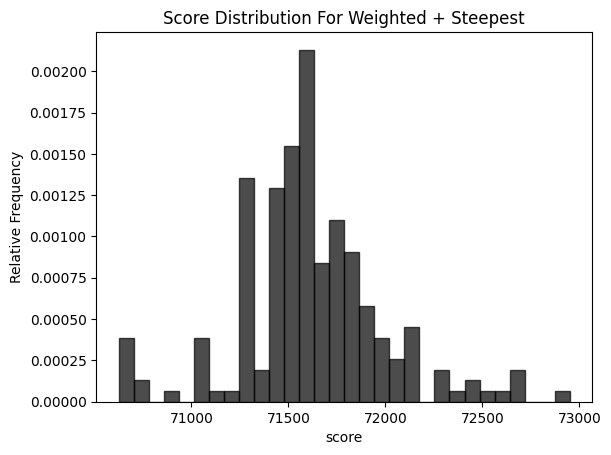

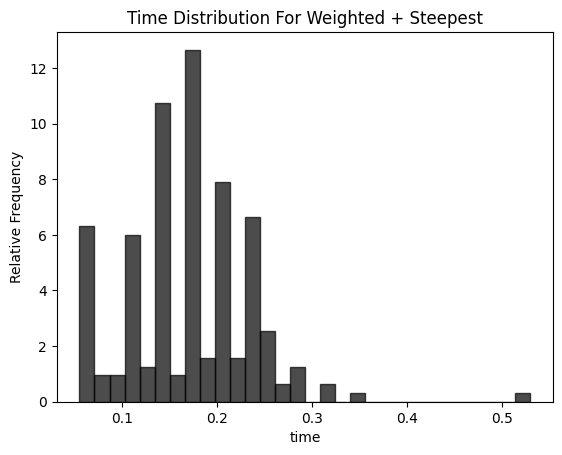

___________________________________________________________________
For Node: 153


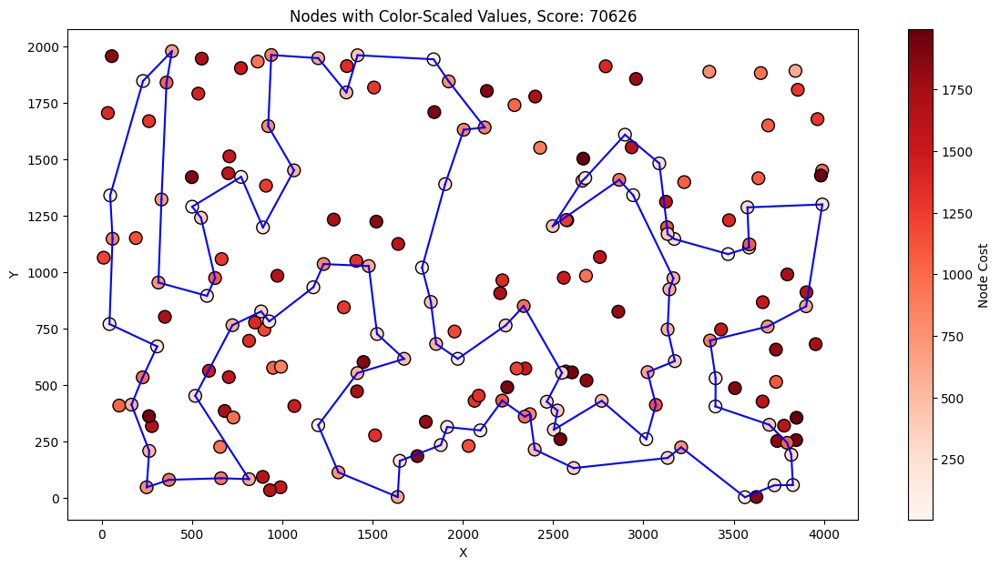

Best solution: [0, 117, 93, 68, 46, 115, 139, 193, 41, 5, 42, 181, 159, 69, 108, 18, 22, 146, 34, 160, 48, 54, 177, 10, 190, 4, 112, 184, 43, 116, 65, 59, 118, 51, 151, 133, 162, 123, 127, 70, 135, 154, 180, 53, 121, 100, 26, 86, 75, 44, 25, 16, 171, 175, 113, 56, 31, 78, 145, 179, 196, 81, 90, 165, 40, 185, 106, 178, 3, 14, 144, 62, 9, 148, 102, 49, 52, 55, 57, 92, 129, 82, 120, 2, 101, 1, 97, 152, 124, 94, 63, 79, 80, 176, 137, 23, 186, 89, 183, 143]
___________________________________________________________________
For Node: 54


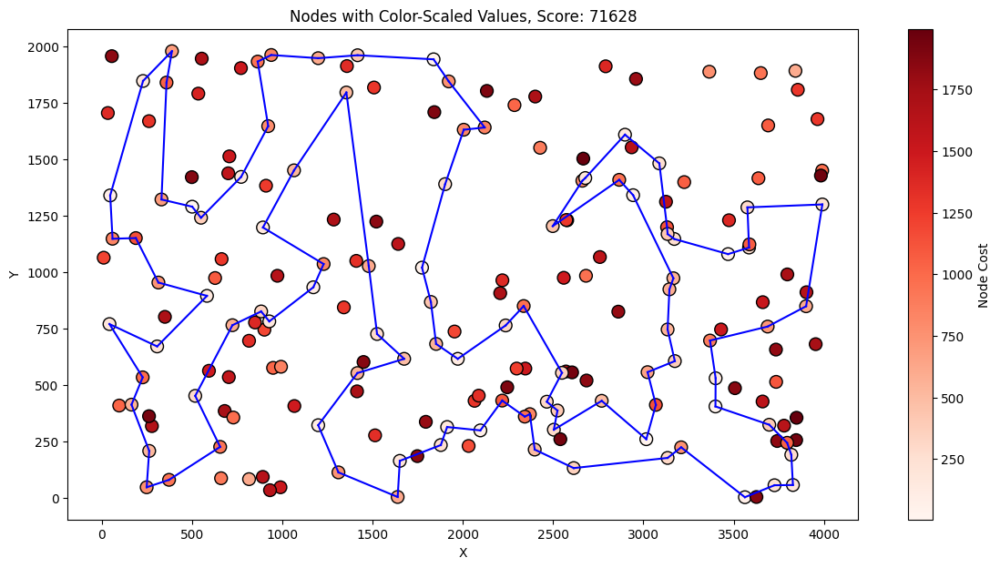

___________________________________________________________________
For Node: 125


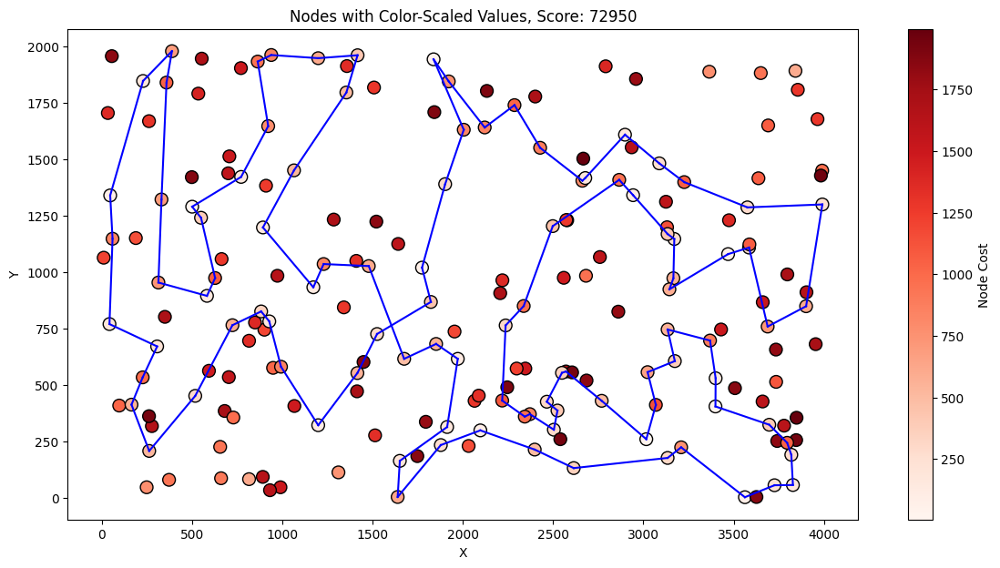

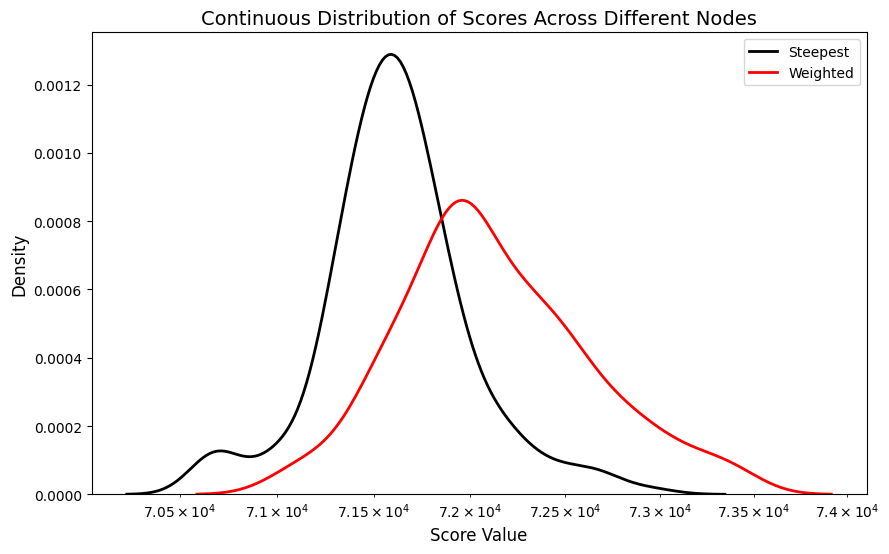

Overall Stats: 
 Minimum: 70626 Maximum: 72950 Median: 71628.0 Mean: 71619.03 Standard Deviation: 379.2999197205294
Time Stats: 
 Minimum: 0.05518364906311035 Maximum: 0.5293750762939453 Median: 0.17193317413330078 Mean: 0.17024305701255799 Standard Deviation: 0.06481566502452277
Comparison Stats: 
 Minimum: 7 Maximum: 1916 Median: 462.0 Mean: 513.755 Standard Deviation: 321.89923108792914 and Relative: 0.007102849305743276


In [110]:
plot_score_distribution(weighted_steepest_result_A, label="Weighted + Steepest", title = "Score Distribution For Weighted + Steepest", x_label = "score")
plot_score_distribution(weighted_steepest_times_A, label="Times Weighted + Steepest", title = "Time Distribution For Weighted + Steepest", x_label = "time")
plot_best_overall(df_A, weighted_steepest_solution_A, weighted_steepest_result_A)
plot_average_overall(df_A, weighted_steepest_solution_A, weighted_steepest_result_A)
plot_worst_overall(df_A, weighted_steepest_solution_A, weighted_steepest_result_A)
plot_score_distributions(weighted_steepest_result_A, weighted_steepest_intermidiate_A, labels = ["Steepest", "Weighted"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(weighted_steepest_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(weighted_steepest_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(weighted_steepest_intermidiate_A, weighted_steepest_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

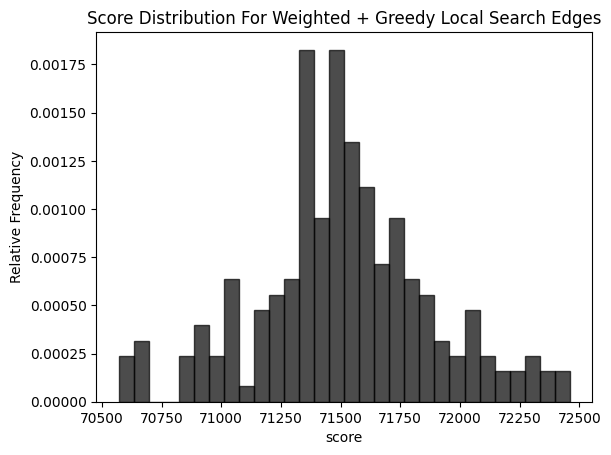

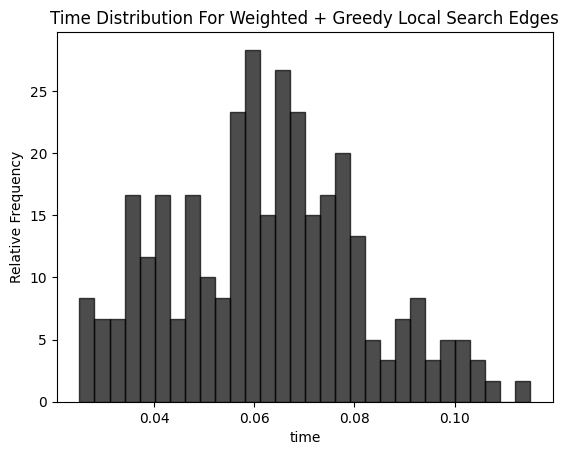

___________________________________________________________________
For Node: 117


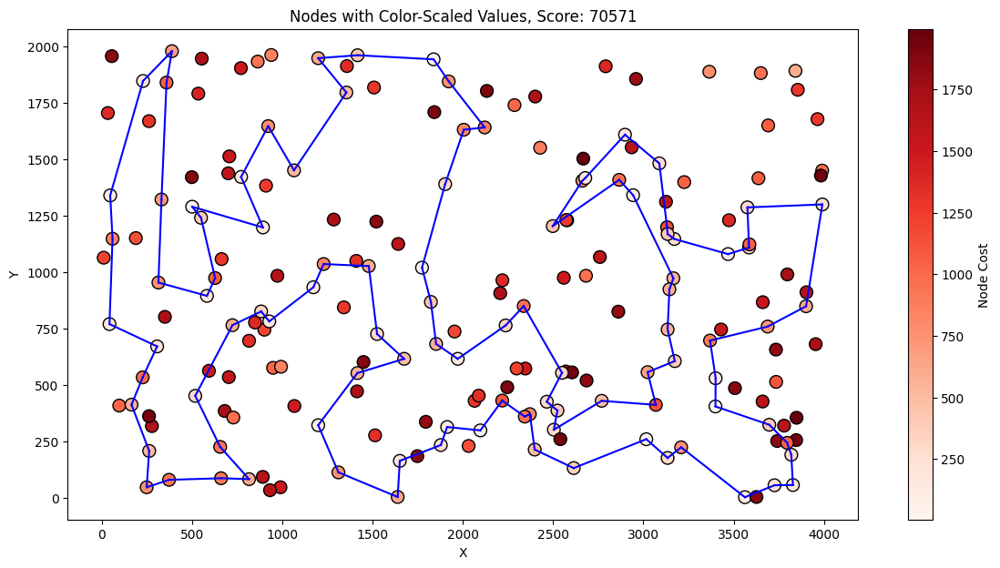

Best solution: [117, 143, 183, 89, 186, 23, 137, 176, 80, 79, 63, 94, 124, 152, 97, 1, 101, 2, 82, 129, 92, 57, 55, 52, 49, 102, 148, 9, 62, 144, 14, 3, 178, 106, 185, 40, 165, 90, 81, 196, 179, 145, 78, 31, 56, 113, 175, 171, 16, 25, 44, 120, 75, 86, 26, 100, 121, 53, 180, 154, 135, 70, 127, 123, 162, 133, 151, 51, 118, 59, 65, 116, 43, 184, 84, 112, 4, 190, 10, 177, 54, 48, 160, 34, 146, 22, 18, 108, 69, 159, 181, 42, 5, 41, 193, 115, 139, 68, 46, 0]
___________________________________________________________________
For Node: 30


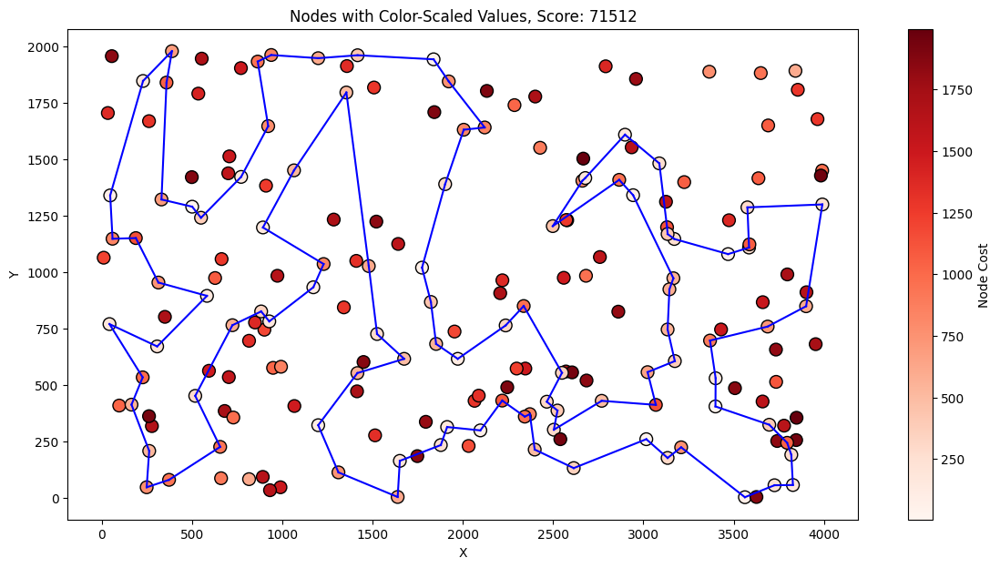

___________________________________________________________________
For Node: 98


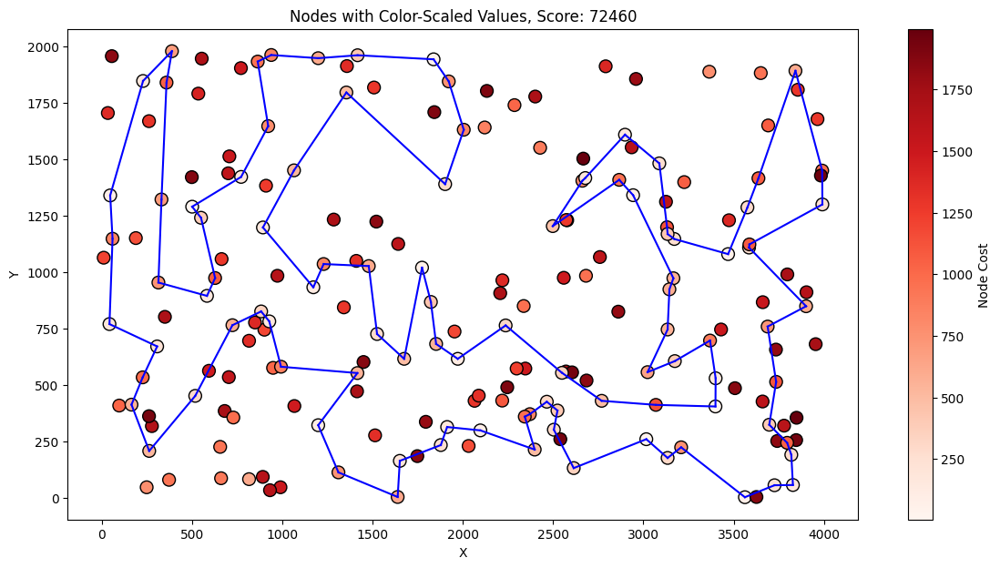

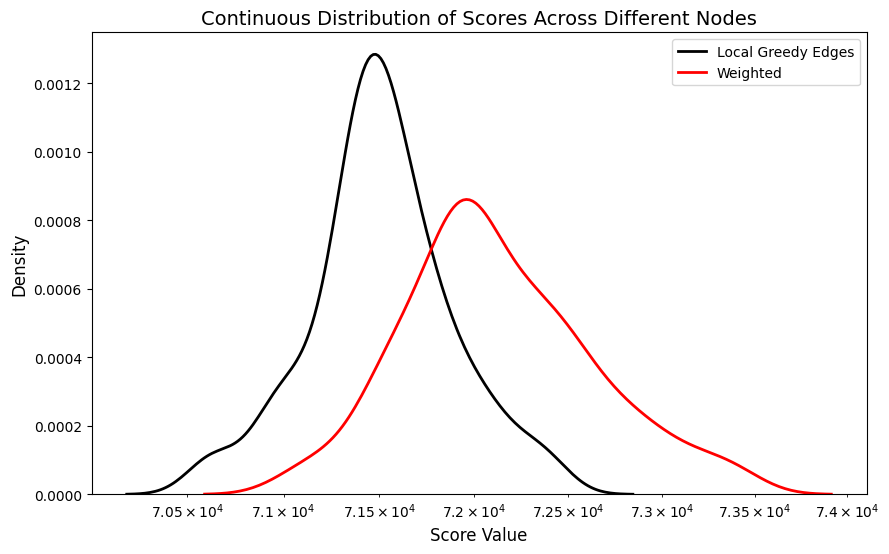

Overall Stats: 
 Minimum: 70571 Maximum: 72460 Median: 71512.0 Mean: 71514.59 Standard Deviation: 368.73520566932586
Time Stats: 
 Minimum: 0.02509140968322754 Maximum: 0.11513876914978027 Median: 0.06198382377624512 Mean: 0.06231655597686767 Standard Deviation: 0.019141323396976544
Comparison Stats: 
 Minimum: 31 Maximum: 1940 Median: 523.0 Mean: 618.195 Standard Deviation: 344.0286717339123 and Relative: 0.00854863933195811


In [111]:
plot_score_distribution(weighted_edges_greedy_local_result_A, label="Weighted + Greedy Local Search (Edges)", title = "Score Distribution For Weighted + Greedy Local Search Edges", x_label = "score")
plot_score_distribution(weighted_edges_greedy_local_times_A, label="Times Weighted + Greedy Local Search (Edges)", title = "Time Distribution For Weighted + Greedy Local Search Edges", x_label = "time")
plot_best_overall(df_A, weighted_edges_greedy_local_solution_A, weighted_edges_greedy_local_result_A)
plot_average_overall(df_A, weighted_edges_greedy_local_solution_A, weighted_edges_greedy_local_result_A)
plot_worst_overall(df_A, weighted_edges_greedy_local_solution_A, weighted_edges_greedy_local_result_A)
plot_score_distributions(weighted_edges_greedy_local_result_A, weighted_edges_greedy_local_intermidiate_A, labels = ["Local Greedy Edges", "Weighted"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(weighted_edges_greedy_local_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(weighted_edges_greedy_local_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(weighted_edges_greedy_local_intermidiate_A, weighted_edges_greedy_local_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

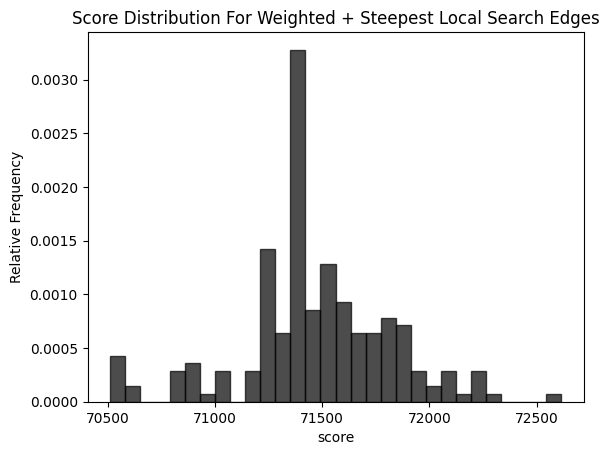

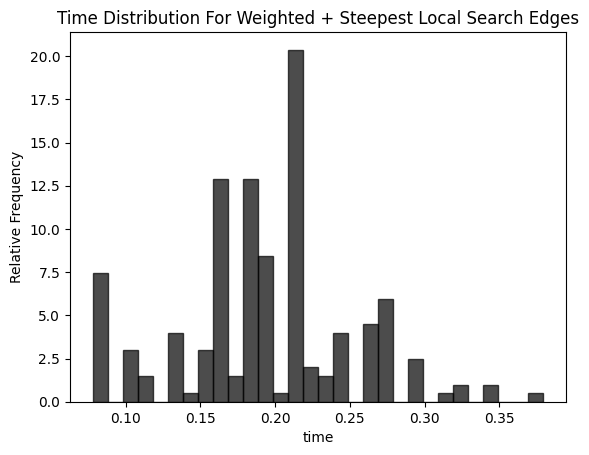

___________________________________________________________________
For Node: 153


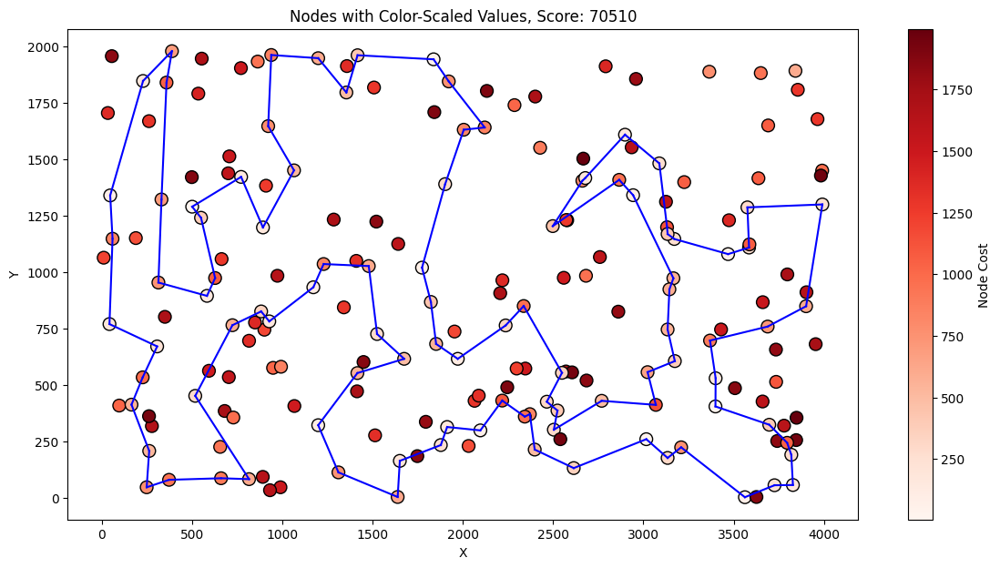

Best solution: [117, 0, 143, 183, 89, 186, 23, 137, 176, 80, 79, 63, 94, 124, 152, 97, 1, 101, 2, 82, 129, 92, 57, 55, 52, 49, 102, 148, 9, 62, 144, 14, 3, 178, 106, 185, 40, 165, 90, 81, 196, 179, 145, 78, 31, 56, 113, 175, 171, 16, 25, 44, 120, 75, 86, 26, 100, 121, 53, 180, 154, 135, 70, 127, 123, 162, 133, 151, 51, 118, 59, 65, 116, 43, 184, 112, 4, 190, 10, 177, 54, 48, 160, 34, 146, 22, 18, 108, 69, 159, 181, 42, 5, 41, 193, 139, 115, 46, 68, 93]
___________________________________________________________________
For Node: 180


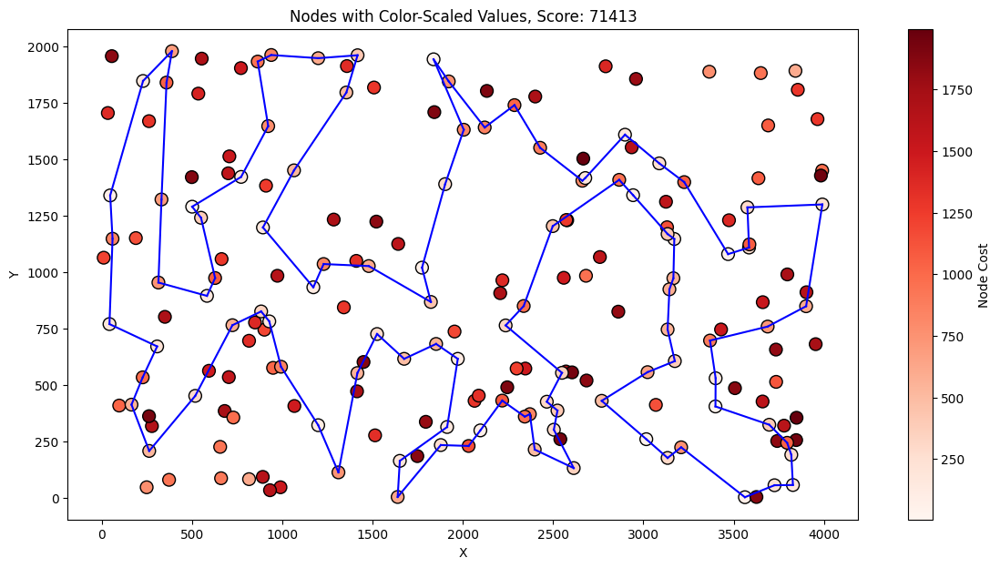

___________________________________________________________________
For Node: 125


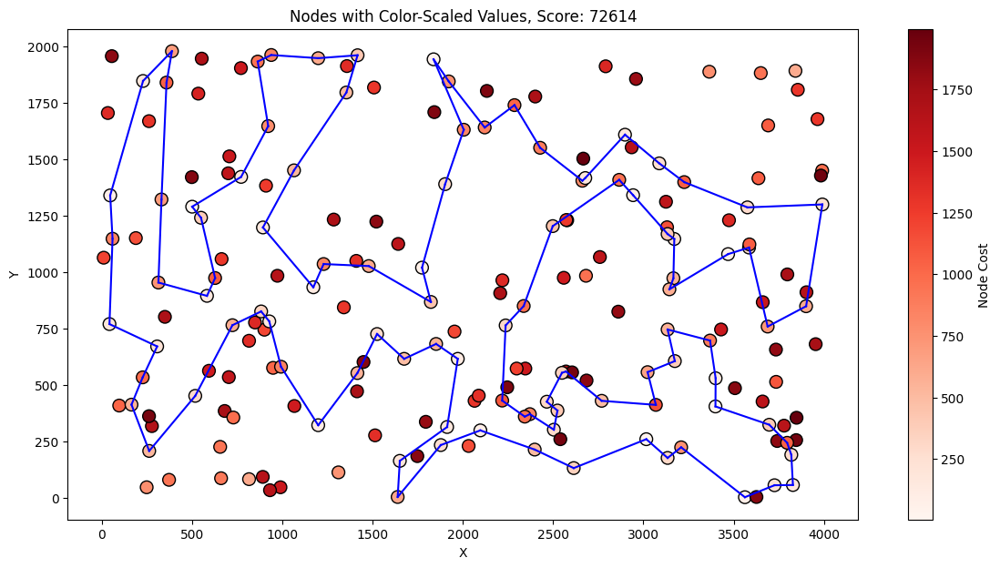

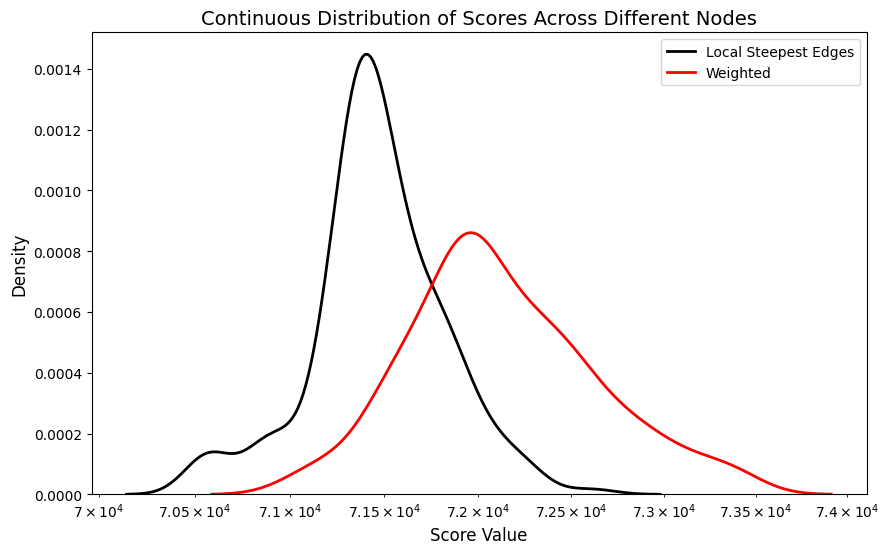

Overall Stats: 
 Minimum: 70510 Maximum: 72614 Median: 71413.0 Mean: 71467.655 Standard Deviation: 350.5588480911586
Time Stats: 
 Minimum: 0.07777953147888184 Maximum: 0.37964367866516113 Median: 0.19074392318725586 Mean: 0.19389994978904723 Standard Deviation: 0.05799384598178342
Comparison Stats: 
 Minimum: 160 Maximum: 2032 Median: 578.0 Mean: 665.13 Standard Deviation: 350.46850514703885 and Relative: 0.009197668268055528


In [112]:
plot_score_distribution(weighted_edges_steepest_local_result_A, label="Weighted + Steepest Local Search (Edges)", title = "Score Distribution For Weighted + Steepest Local Search Edges", x_label = "score")
plot_score_distribution(weighted_edges_steepest_local_times_A, label="Times Weighted + Steepest Local Search (Edges)", title = "Time Distribution For Weighted + Steepest Local Search Edges", x_label = "time")
plot_best_overall(df_A, weighted_edges_steepest_local_solution_A, weighted_edges_steepest_local_result_A)
plot_average_overall(df_A, weighted_edges_steepest_local_solution_A, weighted_edges_steepest_local_result_A)
plot_worst_overall(df_A, weighted_edges_steepest_local_solution_A, weighted_edges_steepest_local_result_A)
plot_score_distributions(weighted_edges_steepest_local_result_A, weighted_edges_steepest_local_intermidiate_A, labels = ["Local Steepest Edges", "Weighted"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(weighted_edges_steepest_local_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(weighted_edges_steepest_local_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(weighted_edges_steepest_local_intermidiate_A, weighted_edges_steepest_local_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

## Results - Instance B

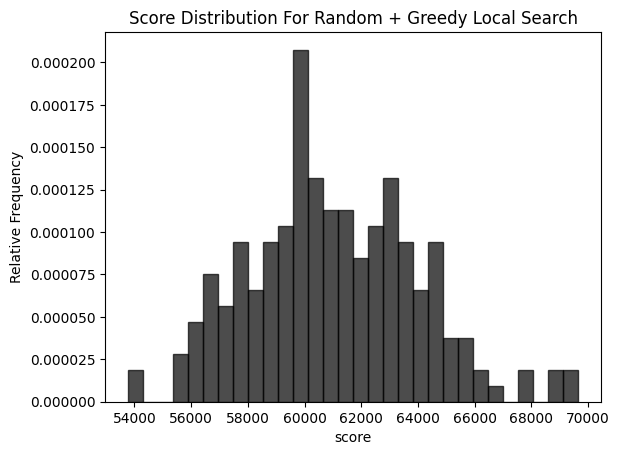

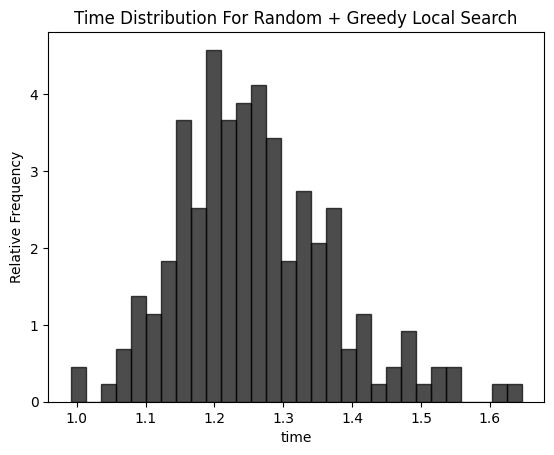

___________________________________________________________________
For Node: 63


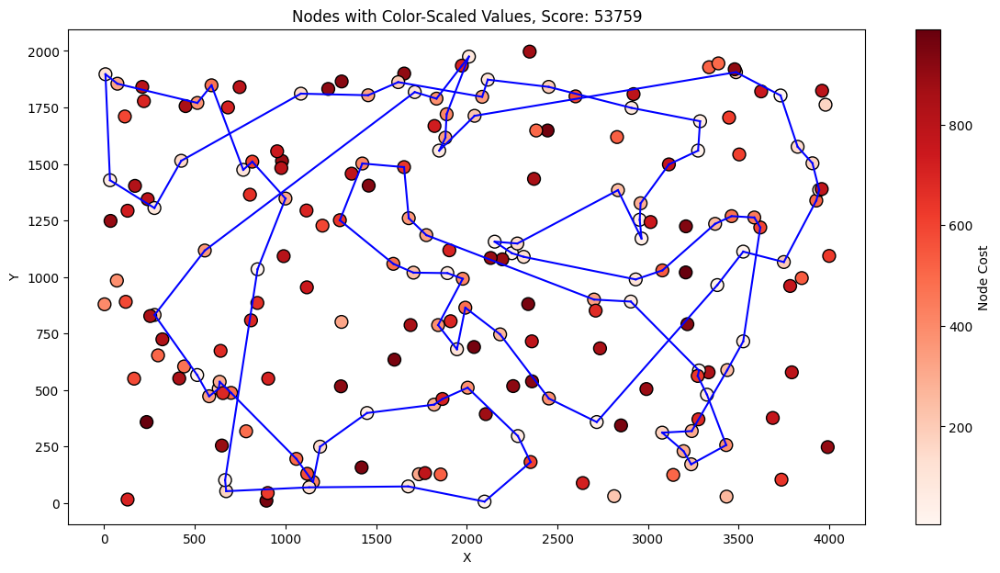

Best solution: [152, 155, 3, 15, 188, 6, 147, 122, 135, 63, 40, 107, 133, 10, 90, 191, 51, 121, 190, 80, 175, 36, 141, 97, 77, 82, 87, 21, 177, 5, 78, 45, 73, 54, 31, 193, 117, 1, 131, 169, 132, 161, 70, 13, 195, 168, 145, 28, 20, 148, 47, 94, 66, 179, 185, 86, 153, 81, 111, 144, 8, 104, 160, 33, 138, 182, 74, 134, 43, 139, 11, 143, 106, 176, 180, 113, 114, 127, 89, 163, 103, 194, 166, 22, 99, 130, 95, 128, 124, 35, 0, 29, 109, 34, 62, 18, 55, 174, 183, 140]
___________________________________________________________________
For Node: 85


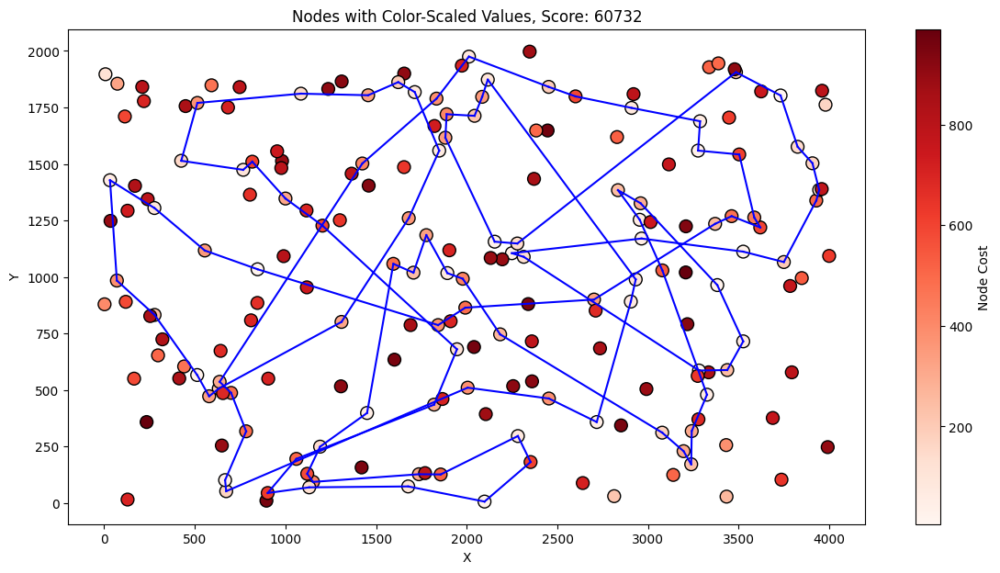

___________________________________________________________________
For Node: 171


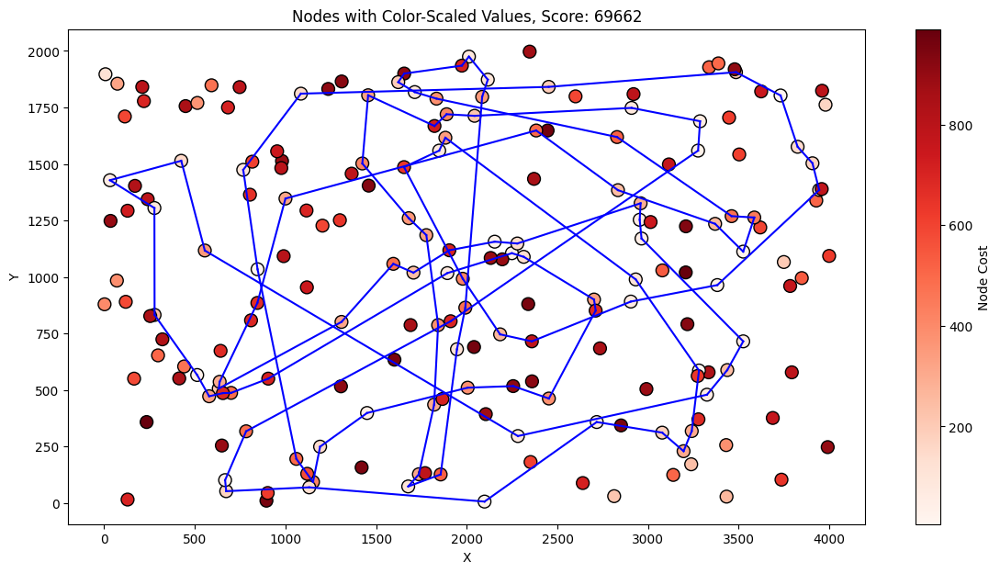

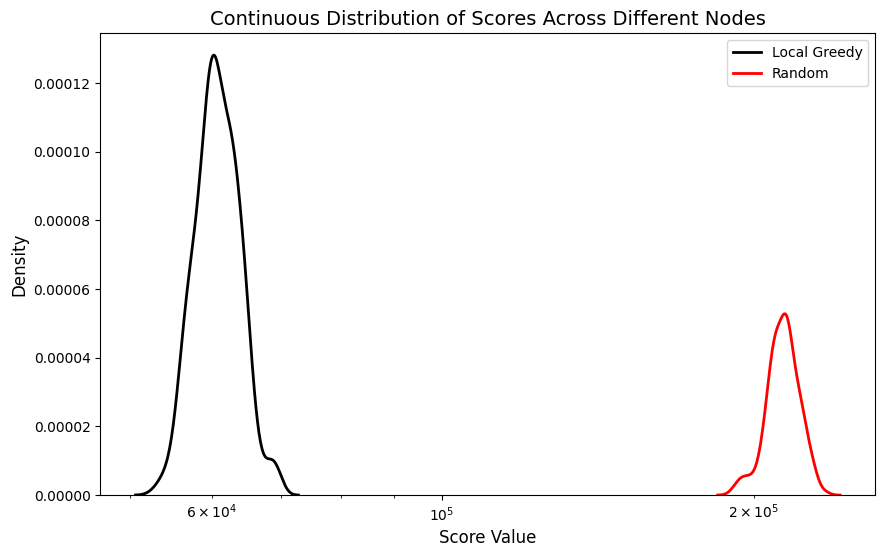

Overall Stats: 
 Minimum: 53759 Maximum: 69662 Median: 60725.5 Mean: 61000.025 Standard Deviation: 2969.745627890544
Time Stats: 
 Minimum: 0.9913332462310791 Maximum: 1.6461806297302246 Median: 1.2453532218933105 Mean: 1.258032865524292 Standard Deviation: 0.11121851106691925
Comparison Stats: 
 Minimum: 126772 Maximum: 172379 Median: 152742.0 Mean: 152879.325 Standard Deviation: 7770.196830156557 and Relative: 0.7144948367385331


In [113]:
plot_score_distribution(random_greedy_local_result_B, label="Random + Greedy Local Search", title = "Score Distribution For Random + Greedy Local Search", x_label = "score")
plot_score_distribution(random_greedy_local_times_B, label="Times Random + Greedy Local Search", title = "Time Distribution For Random + Greedy Local Search", x_label = "time")
plot_best_overall(df_B, random_greedy_local_solution_B, random_greedy_local_result_B)
plot_average_overall(df_B, random_greedy_local_solution_B, random_greedy_local_result_B)
plot_worst_overall(df_B, random_greedy_local_solution_B, random_greedy_local_result_B)
plot_score_distributions(random_greedy_local_result_B, random_greedy_local_intermidiate_B, labels = ["Local Greedy", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_greedy_local_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_greedy_local_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(random_greedy_local_intermidiate_B, random_greedy_local_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

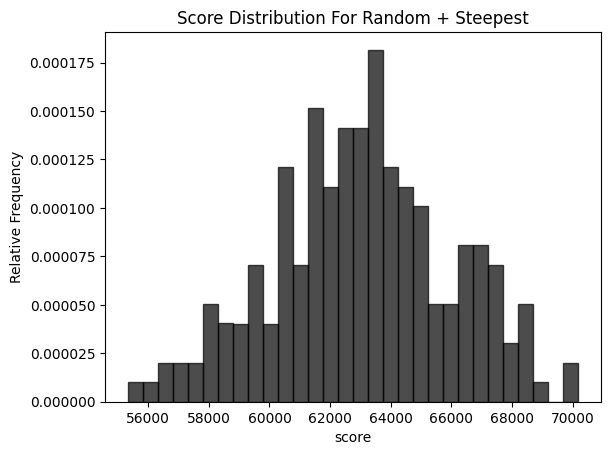

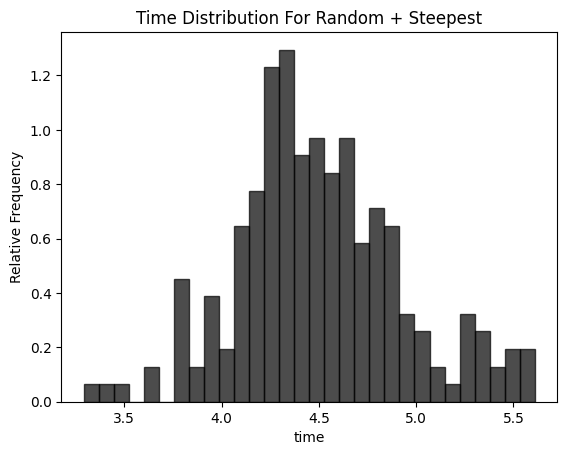

___________________________________________________________________
For Node: 17


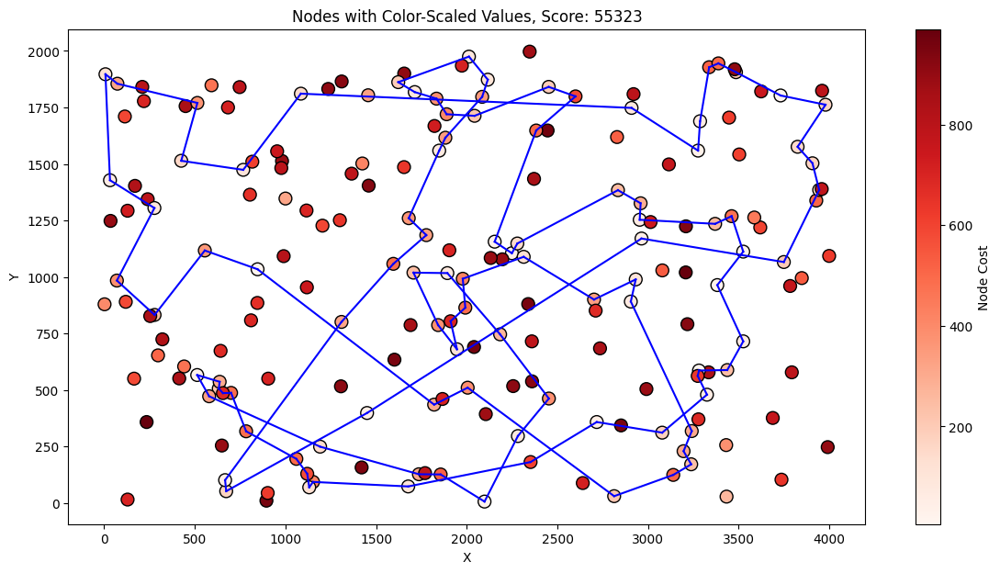

Best solution: [40, 63, 135, 38, 1, 131, 121, 21, 82, 187, 165, 127, 89, 103, 106, 124, 143, 35, 160, 144, 56, 8, 104, 138, 33, 111, 81, 77, 141, 91, 61, 5, 193, 117, 54, 31, 164, 73, 136, 45, 142, 175, 78, 36, 97, 153, 163, 113, 180, 176, 194, 166, 86, 185, 130, 95, 18, 55, 34, 109, 0, 29, 189, 184, 155, 145, 13, 132, 169, 188, 70, 3, 15, 195, 168, 139, 11, 182, 25, 190, 80, 177, 62, 179, 94, 47, 148, 60, 20, 28, 149, 4, 140, 183, 152, 147, 90, 122, 133, 107]
___________________________________________________________________
For Node: 130


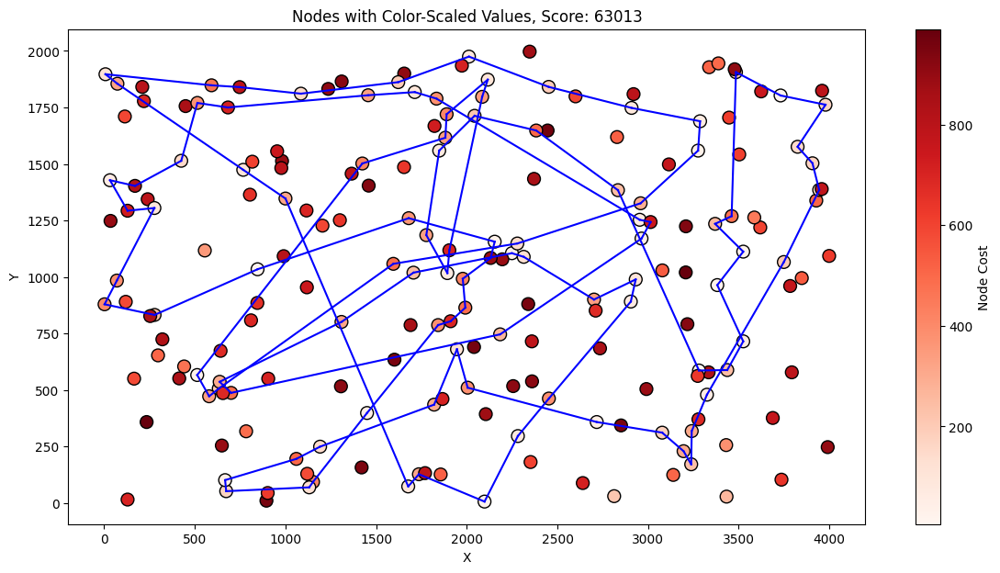

___________________________________________________________________
For Node: 13


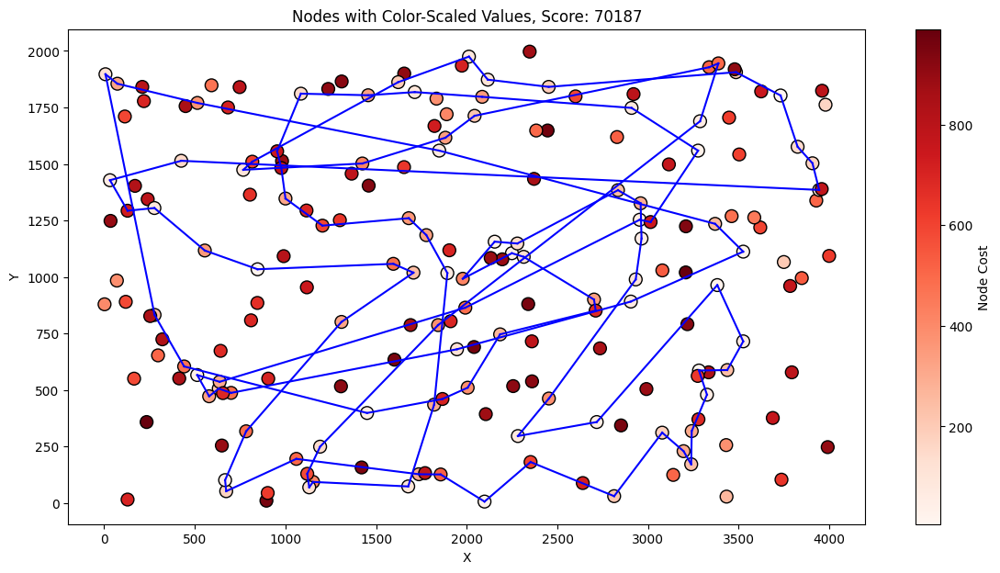

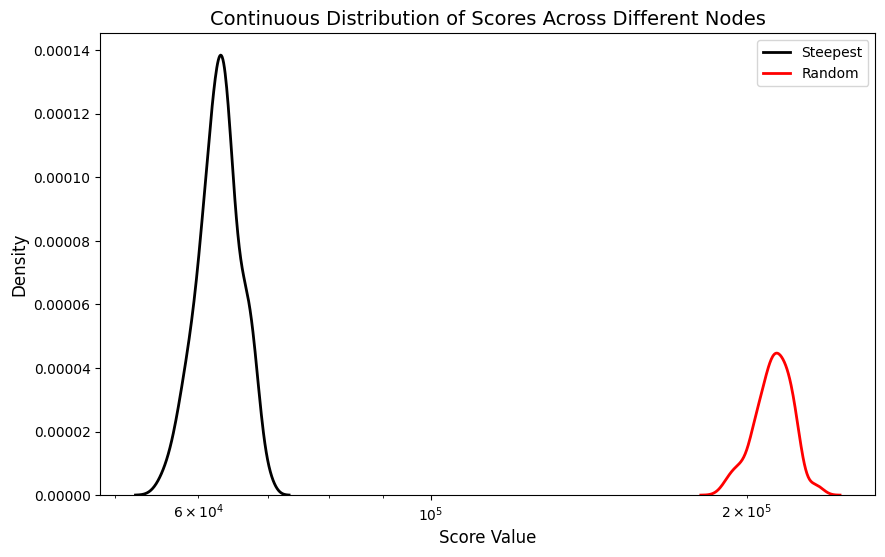

Overall Stats: 
 Minimum: 55323 Maximum: 70187 Median: 63004.5 Mean: 63036.025 Standard Deviation: 2922.762625389719
Time Stats: 
 Minimum: 3.292180299758911 Maximum: 5.609217643737793 Median: 4.457748532295227 Mean: 4.500971374511718 Standard Deviation: 0.42939041504294345
Comparison Stats: 
 Minimum: 125998 Maximum: 176114 Median: 150306.0 Mean: 149516.695 Standard Deviation: 9057.444473579453 and Relative: 0.7029495431067645


In [114]:
plot_score_distribution(random_steepest_result_B, label="Random + Steepest", title = "Score Distribution For Random + Steepest", x_label = "score")
plot_score_distribution(random_steepest_times_B, label="Times Random + Steepest", title = "Time Distribution For Random + Steepest", x_label = "time")
plot_best_overall(df_B, random_steepest_solution_B, random_steepest_result_B)
plot_average_overall(df_B, random_steepest_solution_B, random_steepest_result_B)
plot_worst_overall(df_B, random_steepest_solution_B, random_steepest_result_B)
plot_score_distributions(random_steepest_result_B, random_steepest_intermidiate_B, labels = ["Steepest", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_steepest_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_steepest_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(random_steepest_intermidiate_B, random_steepest_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

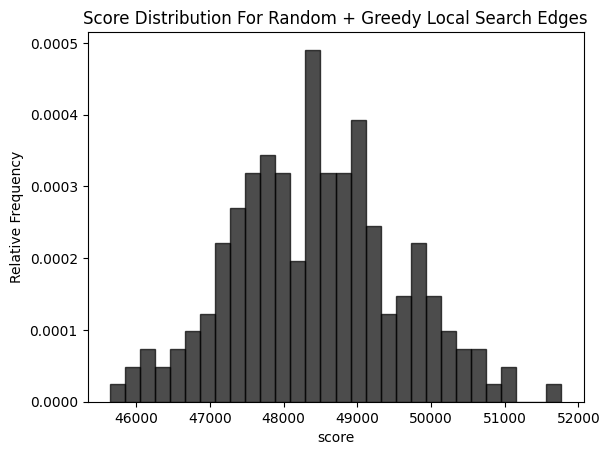

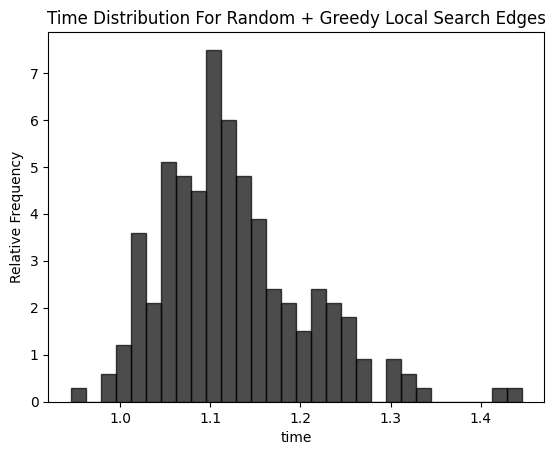

___________________________________________________________________
For Node: 198


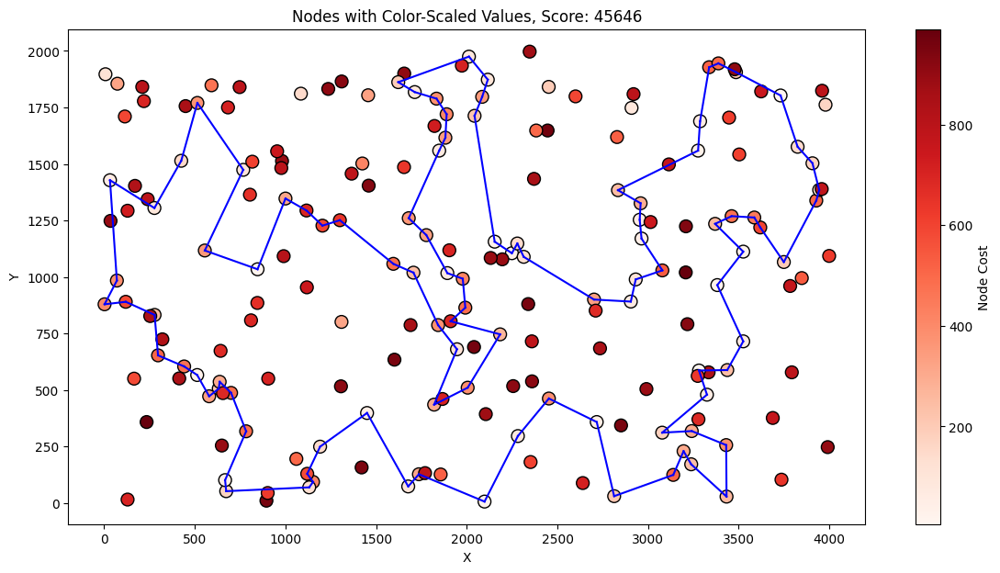

Best solution: [16, 1, 156, 198, 117, 193, 31, 54, 73, 136, 190, 80, 175, 78, 142, 5, 177, 36, 61, 141, 77, 81, 153, 187, 165, 89, 127, 137, 114, 103, 163, 113, 176, 194, 166, 86, 185, 95, 130, 99, 22, 179, 66, 94, 47, 148, 20, 28, 149, 4, 140, 183, 34, 55, 18, 62, 128, 124, 106, 143, 35, 109, 0, 29, 145, 15, 3, 70, 188, 169, 132, 13, 195, 168, 139, 11, 33, 160, 144, 56, 111, 82, 21, 8, 104, 138, 182, 74, 118, 98, 51, 121, 131, 90, 133, 122, 135, 63, 38, 27]
___________________________________________________________________
For Node: 66


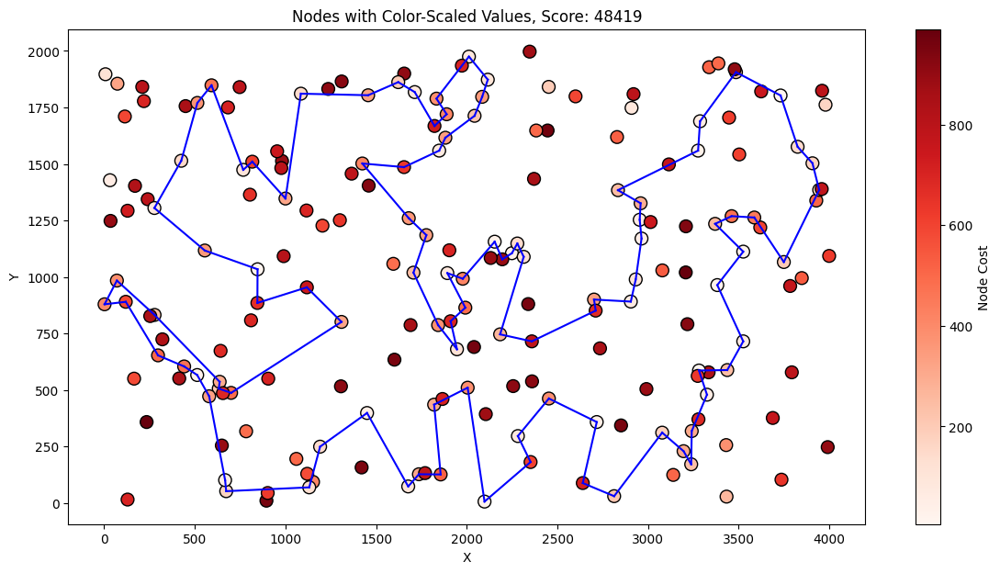

___________________________________________________________________
For Node: 86


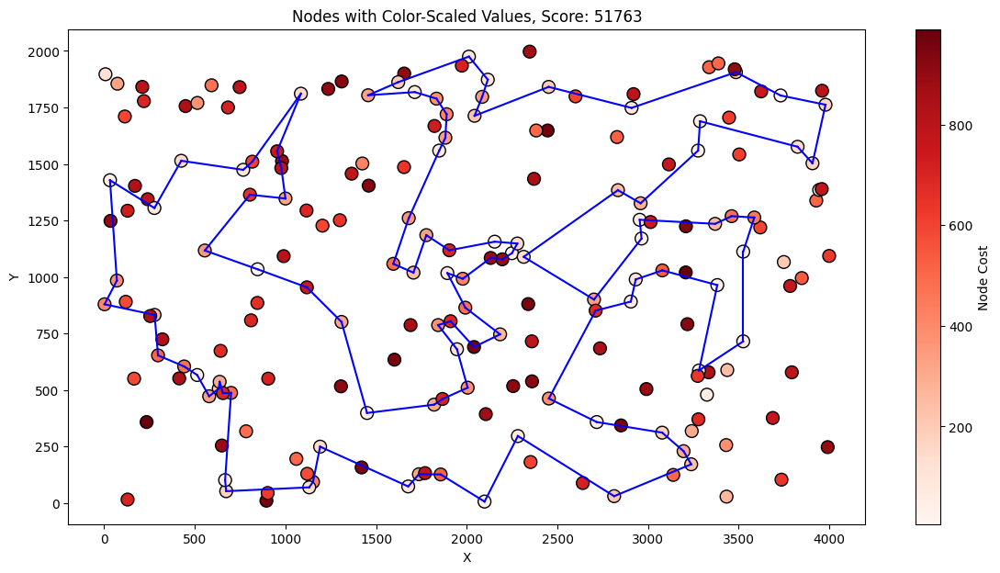

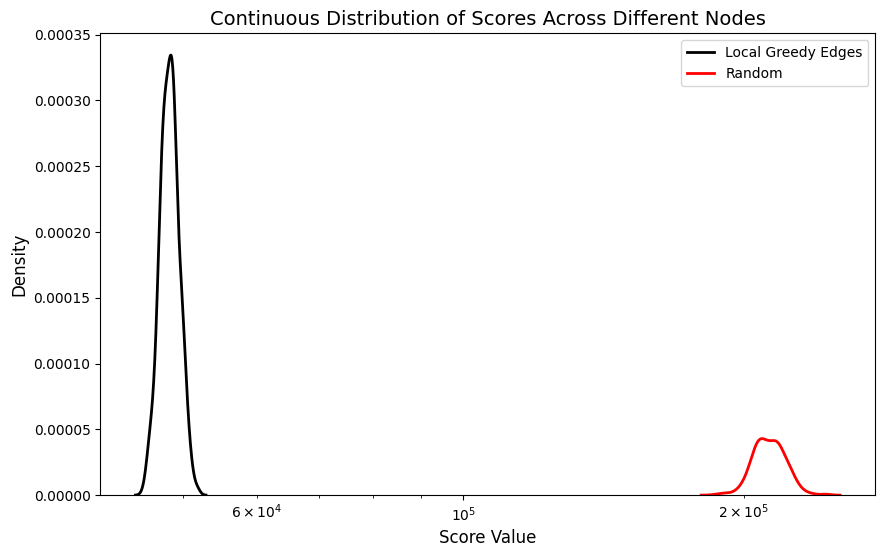

Overall Stats: 
 Minimum: 45646 Maximum: 51763 Median: 48415.5 Mean: 48426.79 Standard Deviation: 1119.5423957581957
Time Stats: 
 Minimum: 0.9449450969696045 Maximum: 1.4455077648162842 Median: 1.1133363246917725 Mean: 1.1252160930633546 Standard Deviation: 0.0802308435574388
Comparison Stats: 
 Minimum: 139759 Maximum: 198519 Median: 164483.5 Mean: 165011.54 Standard Deviation: 8482.050825619945 and Relative: 0.7727606400231208


In [115]:
plot_score_distribution(random_edge_greedy_local_result_B, label="Random + Greedy Local Search (Edges)", title = "Score Distribution For Random + Greedy Local Search Edges", x_label = "score")
plot_score_distribution(random_edge_greedy_local_times_B, label="Times Random + Greedy Local Search", title = "Time Distribution For Random + Greedy Local Search Edges", x_label = "time")
plot_best_overall(df_B, random_edge_greedy_local_solution_B, random_edge_greedy_local_result_B)
plot_average_overall(df_B, random_edge_greedy_local_solution_B, random_edge_greedy_local_result_B)
plot_worst_overall(df_B, random_edge_greedy_local_solution_B, random_edge_greedy_local_result_B)
plot_score_distributions(random_edge_greedy_local_result_B, random_edge_greedy_local_intermidiate_B, labels = ["Local Greedy Edges", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_edge_greedy_local_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_edge_greedy_local_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(random_edge_greedy_local_intermidiate_B, random_edge_greedy_local_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

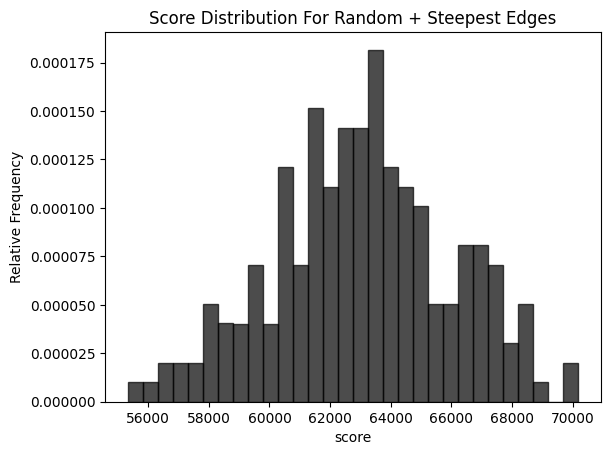

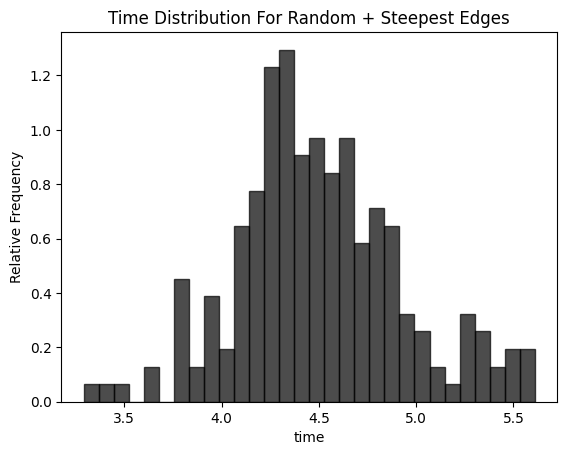

___________________________________________________________________
For Node: 146


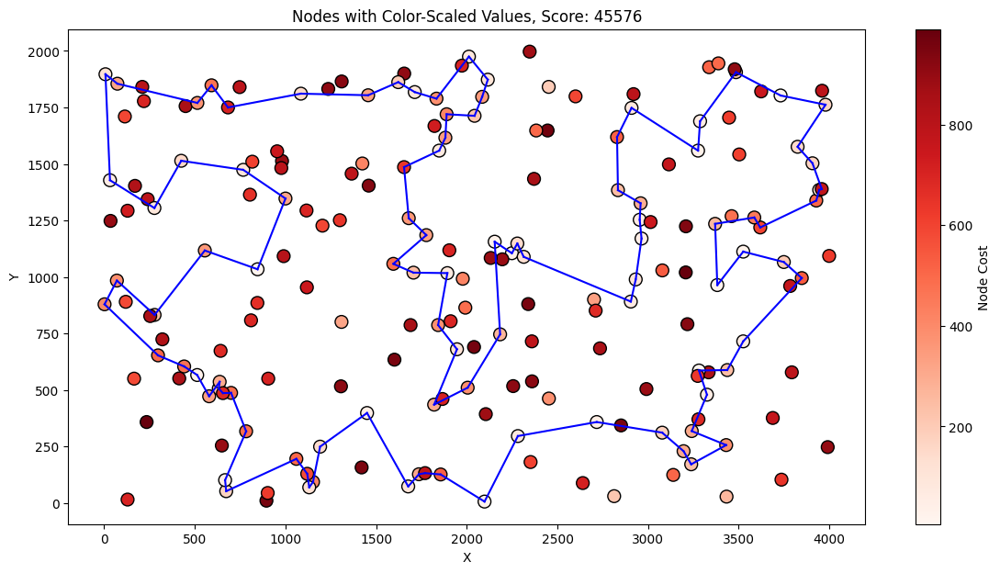

Best solution: [163, 89, 127, 114, 103, 113, 176, 194, 166, 172, 179, 185, 86, 95, 99, 22, 66, 94, 154, 47, 148, 60, 20, 28, 140, 183, 152, 170, 34, 55, 18, 62, 124, 106, 35, 109, 0, 29, 111, 82, 21, 8, 104, 33, 138, 182, 11, 139, 43, 168, 195, 13, 145, 15, 3, 70, 132, 169, 188, 6, 147, 178, 10, 133, 107, 40, 63, 135, 122, 90, 51, 121, 131, 1, 38, 27, 156, 198, 117, 193, 54, 31, 164, 73, 136, 190, 80, 45, 142, 175, 78, 5, 177, 36, 61, 79, 91, 141, 77, 153]
___________________________________________________________________
For Node: 49


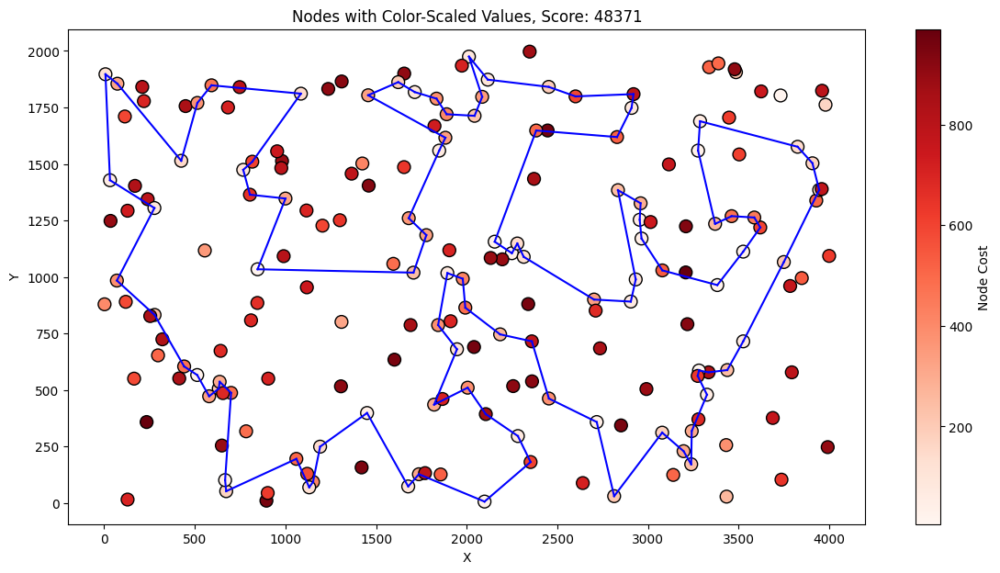

___________________________________________________________________
For Node: 20


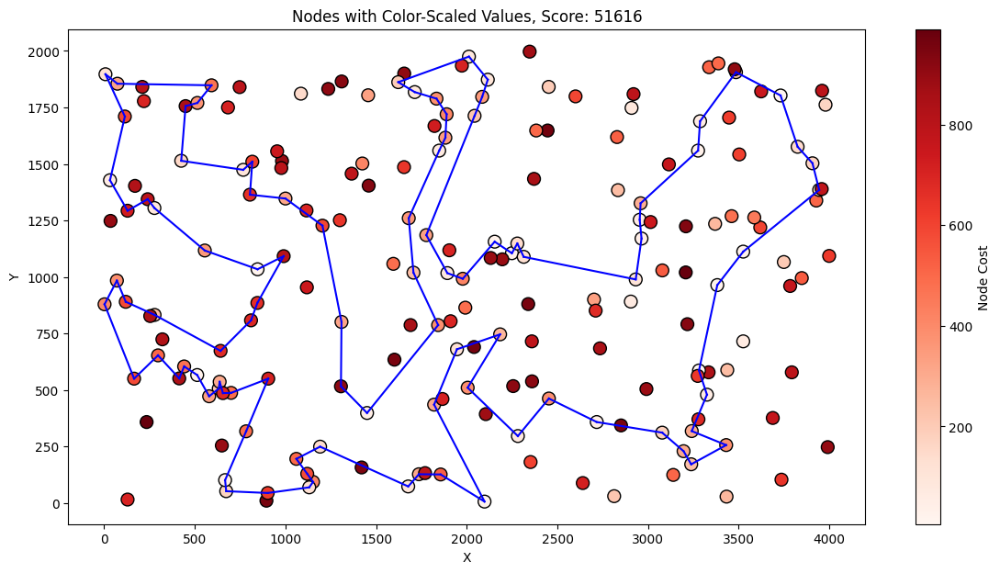

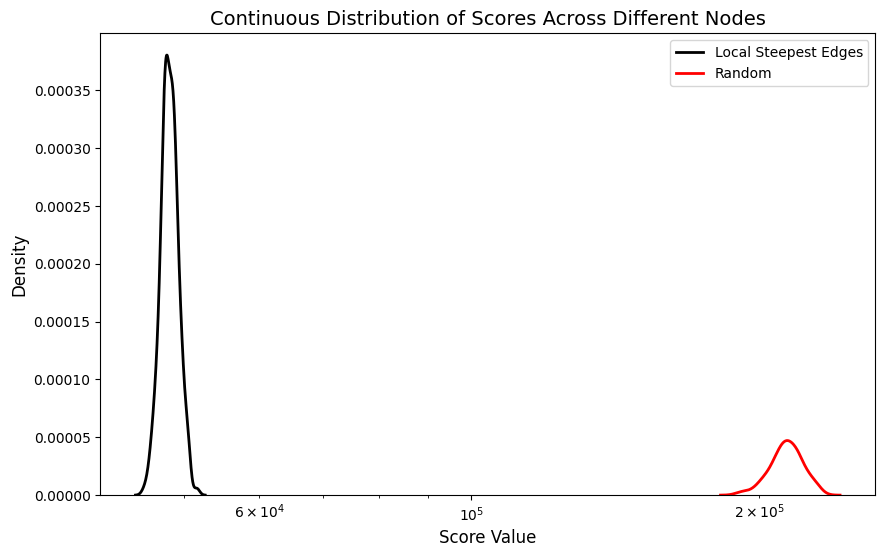

Overall Stats: 
 Minimum: 45576 Maximum: 51616 Median: 48367.0 Mean: 48366.0 Standard Deviation: 1002.5821761830798
Time Stats: 
 Minimum: 2.9756174087524414 Maximum: 4.363769054412842 Median: 3.656740427017212 Mean: 3.654414175748825 Standard Deviation: 0.21584095722427762
Comparison Stats: 
 Minimum: 143198 Maximum: 184917 Median: 165693.0 Mean: 165624.22 Standard Deviation: 8331.760316499749 and Relative: 0.7736434708595111


In [116]:
plot_score_distribution(random_steepest_result_B, label="Random + Steepest (Edges)", title = "Score Distribution For Random + Steepest Edges", x_label = "score")
plot_score_distribution(random_steepest_times_B, label="Times Random + Steepest (Edges)", title = "Time Distribution For Random + Steepest Edges", x_label = "time")
plot_best_overall(df_B, random_edge_steepest_local_solution_B, random_edge_steepest_local_result_B)
plot_average_overall(df_B, random_edge_steepest_local_solution_B, random_edge_steepest_local_result_B)
plot_worst_overall(df_B, random_edge_steepest_local_solution_B, random_edge_steepest_local_result_B)
plot_score_distributions(random_edge_steepest_local_result_B, random_edge_steepest_local_intermidiate_B, labels = ["Local Steepest Edges", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_edge_steepest_local_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_edge_steepest_local_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(random_edge_steepest_local_intermidiate_B, random_edge_steepest_local_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

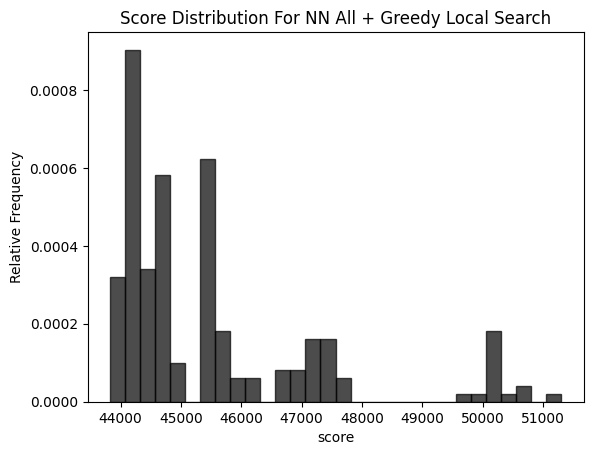

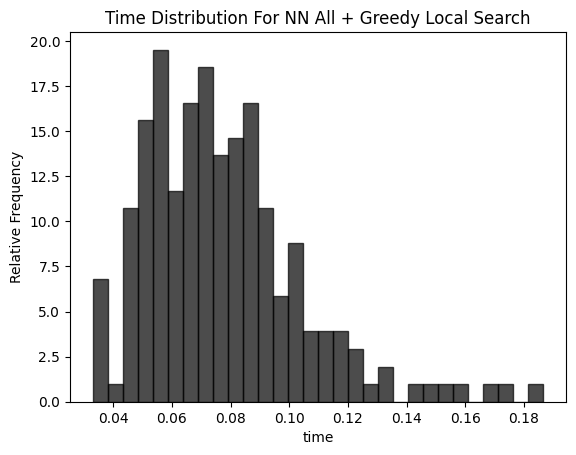

___________________________________________________________________
For Node: 78


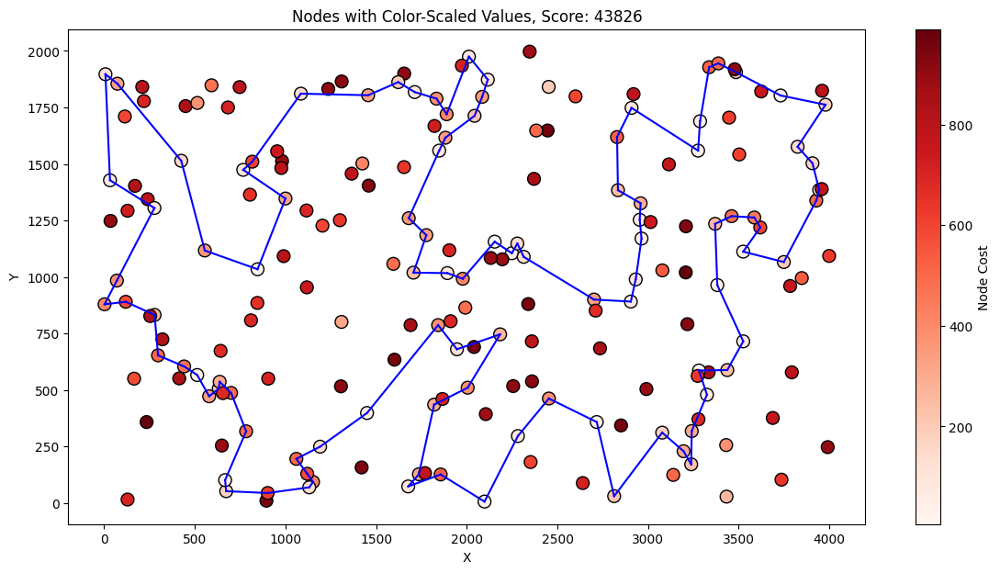

Best solution: [121, 51, 90, 191, 147, 6, 188, 169, 132, 13, 70, 3, 15, 145, 195, 168, 139, 11, 138, 33, 160, 29, 0, 109, 35, 143, 106, 124, 62, 18, 55, 34, 170, 152, 183, 140, 4, 149, 28, 20, 60, 148, 47, 94, 66, 179, 185, 22, 99, 130, 95, 86, 166, 194, 176, 113, 103, 127, 89, 163, 187, 153, 81, 77, 141, 91, 36, 61, 21, 82, 111, 8, 104, 177, 5, 45, 142, 78, 175, 162, 80, 190, 136, 73, 54, 31, 193, 117, 198, 156, 1, 16, 27, 38, 135, 63, 40, 107, 122, 131]
___________________________________________________________________
For Node: 120


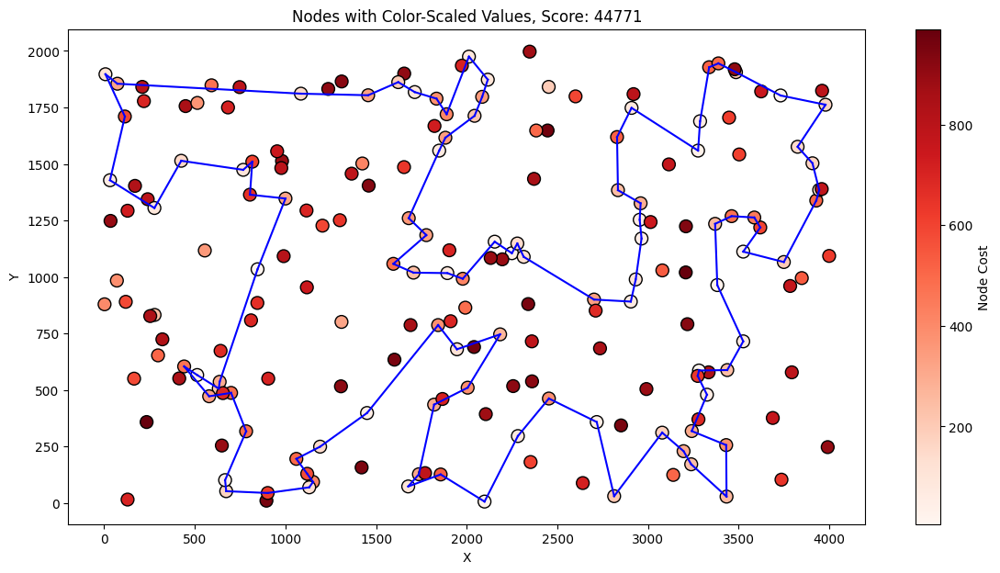

___________________________________________________________________
For Node: 108


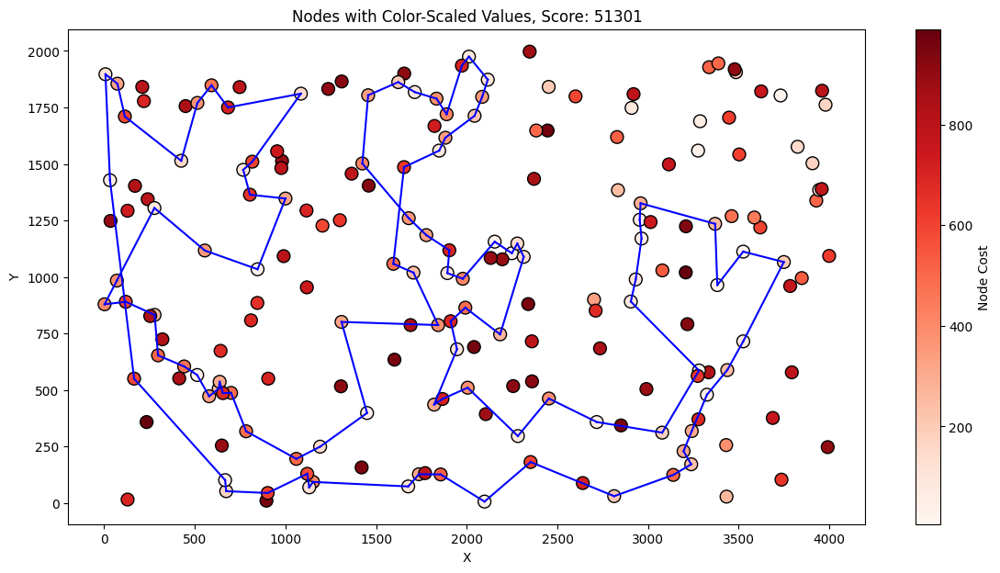

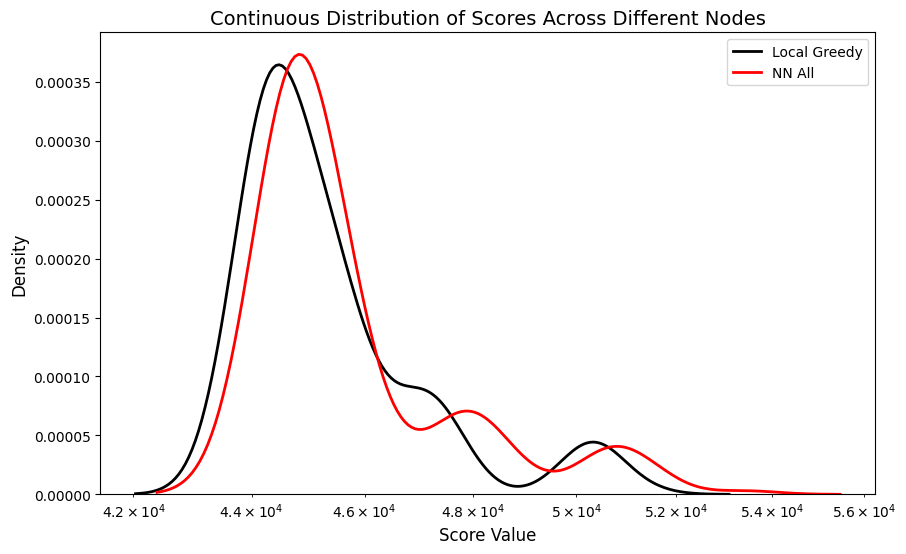

Overall Stats: 
 Minimum: 43826 Maximum: 51301 Median: 44765.0 Mean: 45459.935 Standard Deviation: 1719.6263462668278
Time Stats: 
 Minimum: 0.032937049865722656 Maximum: 0.18666291236877441 Median: 0.07328736782073975 Mean: 0.07732787132263183 Standard Deviation: 0.02681529488331439
Comparison Stats: 
 Minimum: 13 Maximum: 3902 Median: 283.5 Mean: 410.32 Standard Deviation: 525.8537606597484 and Relative: 0.00871733043122736


In [117]:
plot_score_distribution(nn_greedy_local_result_B, label="NN All + Greedy Local Search", title = "Score Distribution For NN All + Greedy Local Search", x_label = "score")
plot_score_distribution(nn_greedy_local_times_B, label="Times NN All + Greedy Local Search", title = "Time Distribution For NN All + Greedy Local Search", x_label = "time")
plot_best_overall(df_B, nn_greedy_local_solution_B, nn_greedy_local_result_B)
plot_average_overall(df_B, nn_greedy_local_solution_B, nn_greedy_local_result_B)
plot_worst_overall(df_B, nn_greedy_local_solution_B, nn_greedy_local_result_B)
plot_score_distributions(nn_greedy_local_result_B, nn_greedy_local_intermidiate_B, labels = ["Local Greedy", "NN All"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(nn_greedy_local_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(nn_greedy_local_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(nn_greedy_local_intermidiate_B, nn_greedy_local_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

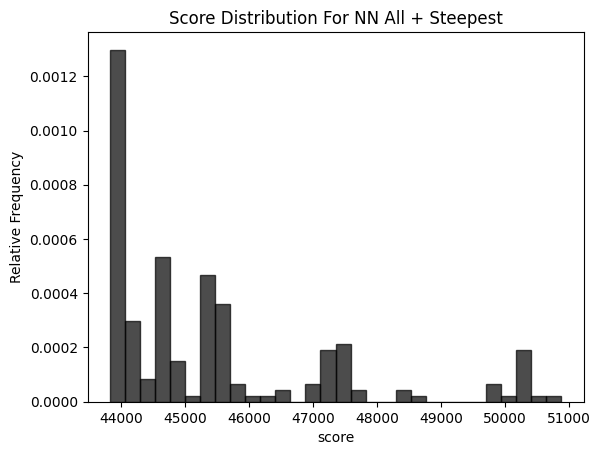

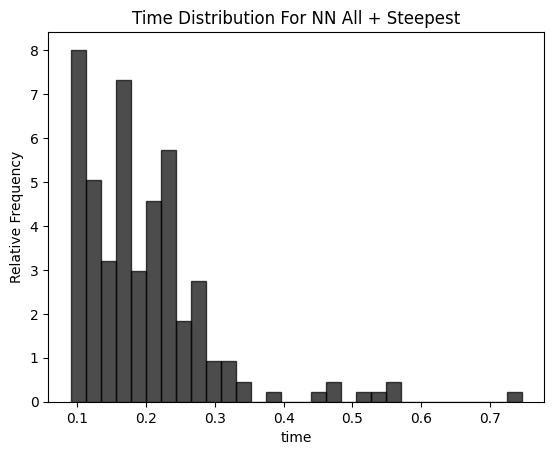

___________________________________________________________________
For Node: 1


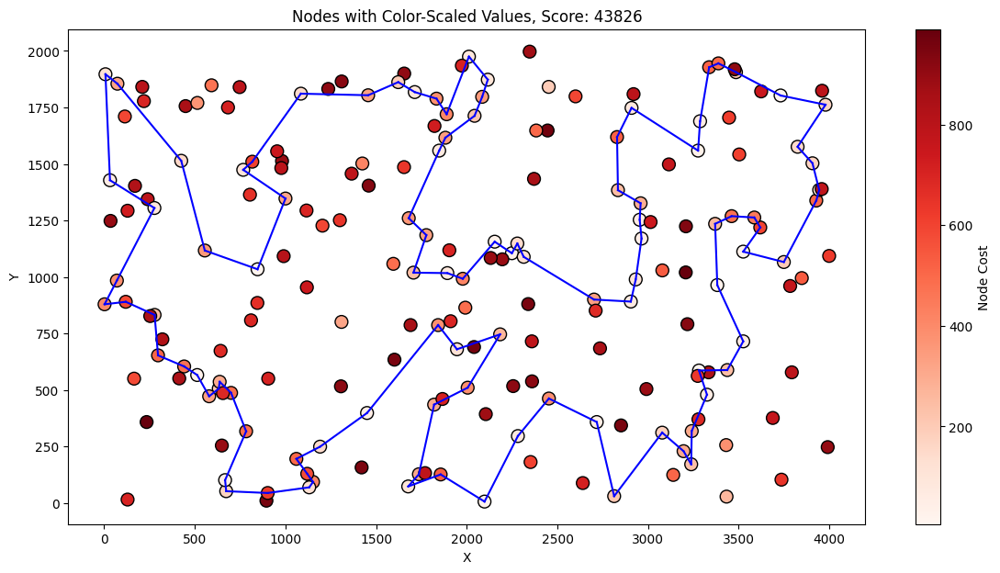

Best solution: [131, 122, 107, 40, 63, 135, 38, 27, 16, 1, 156, 198, 117, 193, 31, 54, 73, 136, 190, 80, 162, 175, 78, 142, 45, 5, 177, 104, 8, 111, 82, 21, 61, 36, 91, 141, 77, 81, 153, 187, 163, 89, 127, 103, 113, 176, 194, 166, 86, 95, 130, 99, 22, 185, 179, 66, 94, 47, 148, 60, 20, 28, 149, 4, 140, 183, 152, 170, 34, 55, 18, 62, 124, 106, 143, 35, 109, 0, 29, 160, 33, 138, 11, 139, 168, 195, 145, 15, 3, 70, 13, 132, 169, 188, 6, 147, 191, 90, 51, 121]
___________________________________________________________________
For Node: 19


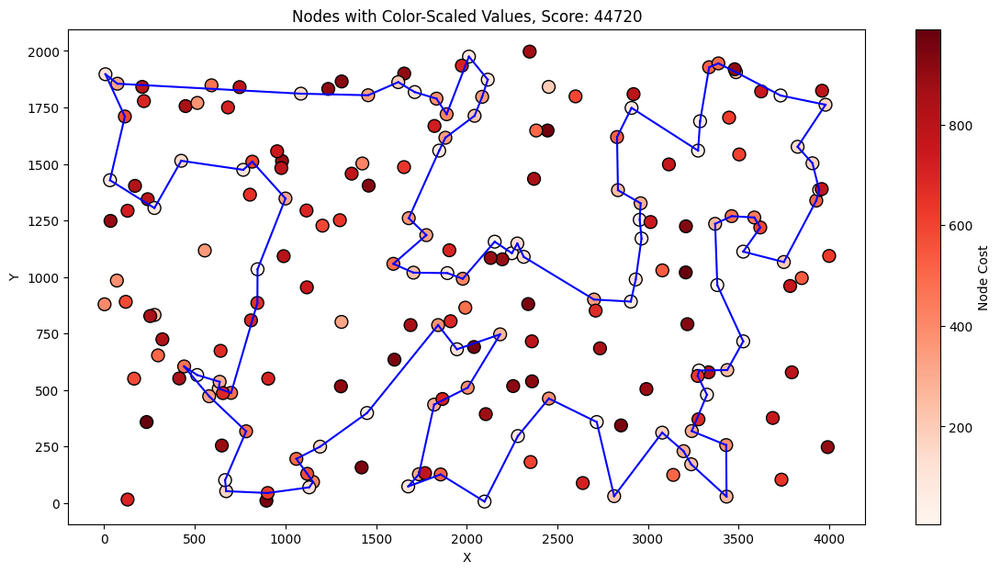

___________________________________________________________________
For Node: 108


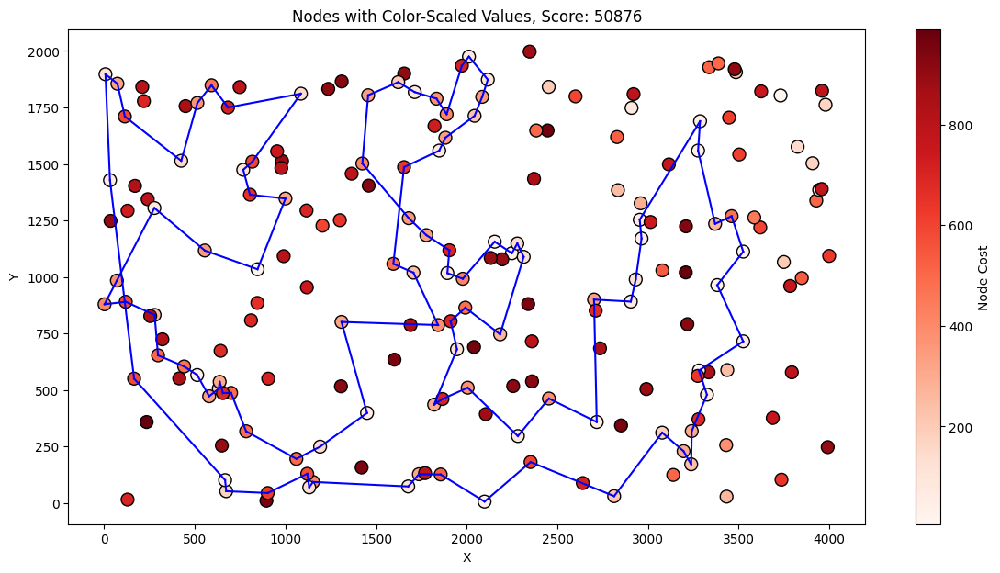

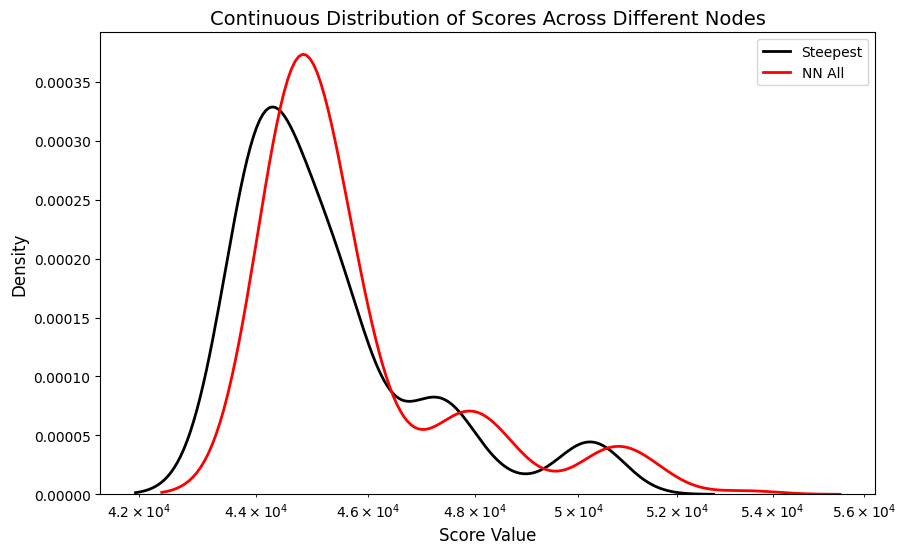

Overall Stats: 
 Minimum: 43826 Maximum: 50876 Median: 44720.0 Mean: 45414.5 Standard Deviation: 1799.8943135639936
Time Stats: 
 Minimum: 0.09027767181396484 Maximum: 0.7459487915039062 Median: 0.1714458465576172 Mean: 0.19576104998588562 Standard Deviation: 0.09600240960777175
Comparison Stats: 
 Minimum: 13 Maximum: 3061 Median: 420.0 Mean: 455.755 Standard Deviation: 445.8440366036087 and Relative: 0.009793104590794393


In [118]:
plot_score_distribution(nn_steepest_result_B, label="NN All + Steepest", title = "Score Distribution For NN All + Steepest", x_label = "score")
plot_score_distribution(nn_steepest_times_B, label="Times NN All + Steepest", title = "Time Distribution For NN All + Steepest", x_label = "time")
plot_best_overall(df_B, nn_steepest_solution_B, nn_steepest_result_B)
plot_average_overall(df_B, nn_steepest_solution_B, nn_steepest_result_B)
plot_worst_overall(df_B, nn_steepest_solution_B, nn_steepest_result_B)
plot_score_distributions(nn_steepest_result_B, nn_steepest_intermidiate_B, labels = ["Steepest", "NN All"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(nn_steepest_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(nn_steepest_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(nn_steepest_intermidiate_B, nn_steepest_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

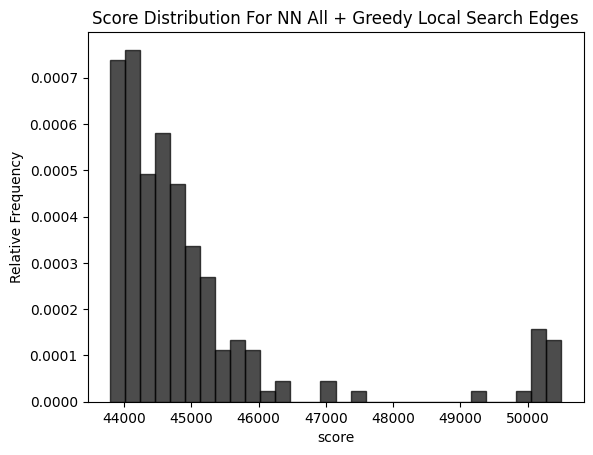

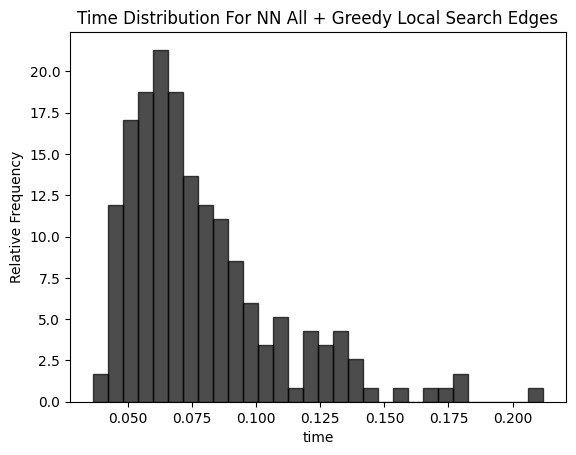

___________________________________________________________________
For Node: 31


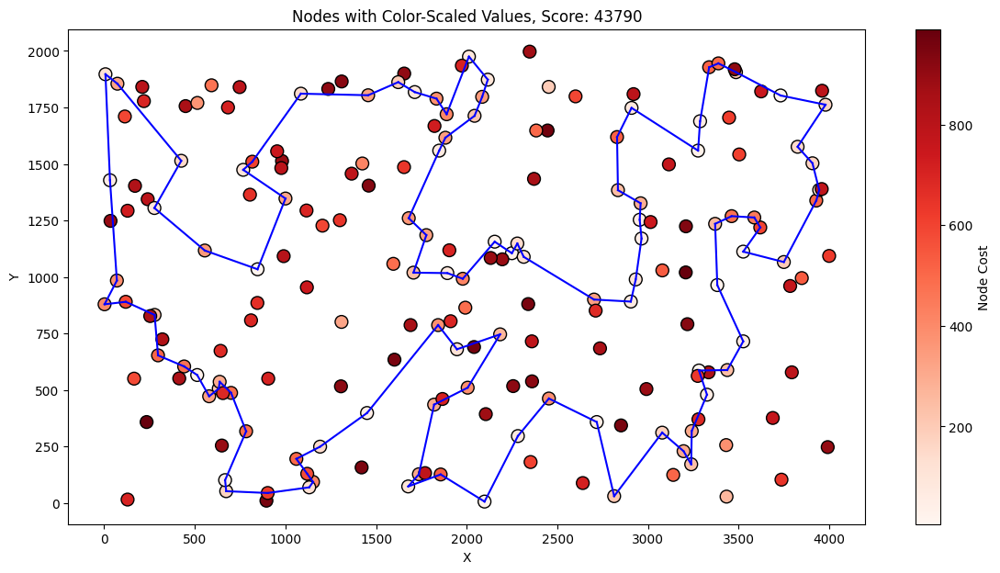

Best solution: [121, 51, 90, 191, 147, 6, 188, 169, 132, 13, 70, 3, 15, 145, 195, 168, 139, 11, 138, 33, 160, 29, 0, 109, 35, 143, 106, 124, 62, 18, 55, 34, 170, 152, 183, 140, 4, 149, 28, 20, 60, 148, 47, 94, 66, 179, 185, 22, 99, 130, 95, 86, 166, 194, 176, 113, 103, 127, 89, 163, 187, 153, 81, 77, 141, 91, 36, 61, 21, 82, 111, 8, 104, 177, 5, 45, 142, 78, 175, 162, 80, 190, 136, 73, 54, 31, 193, 117, 198, 156, 1, 16, 27, 38, 63, 40, 107, 122, 135, 131]
___________________________________________________________________
For Node: 51


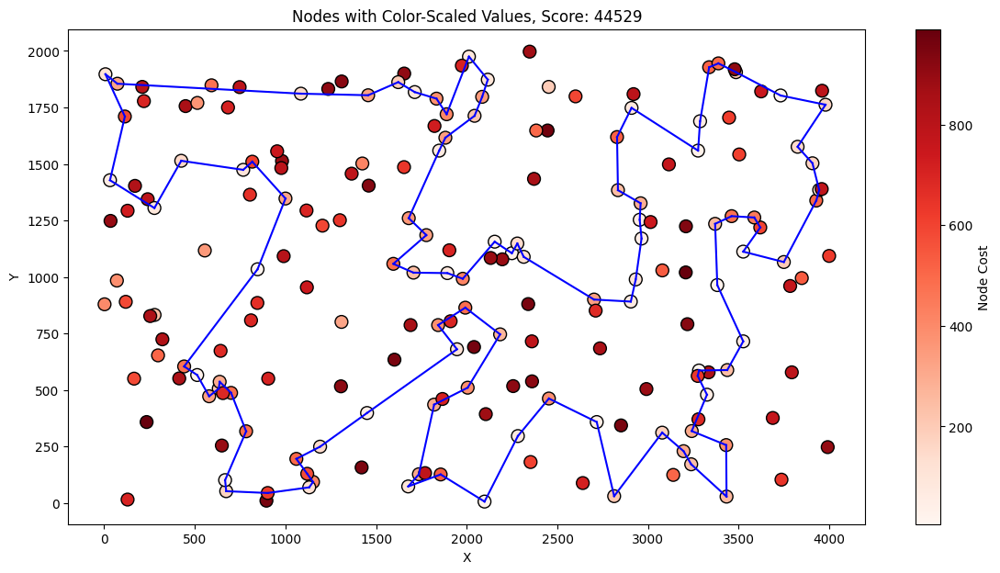

___________________________________________________________________
For Node: 110


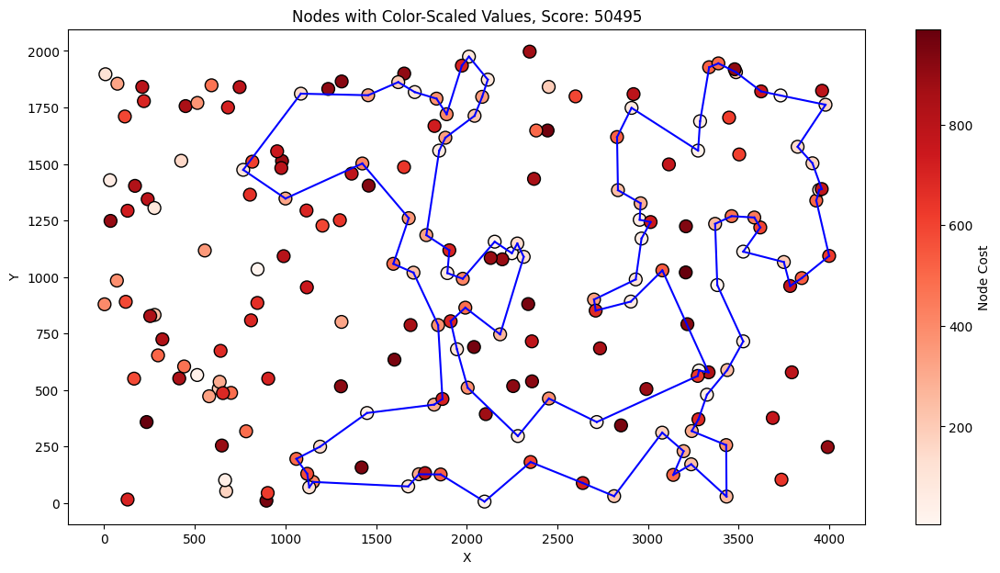

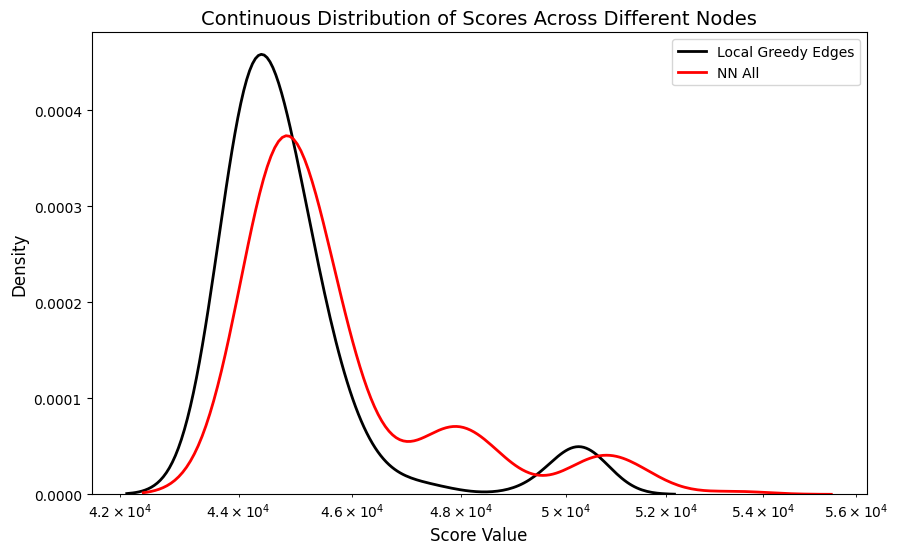

Overall Stats: 
 Minimum: 43790 Maximum: 50495 Median: 44529.0 Mean: 45040.27 Standard Deviation: 1604.9372128217353
Time Stats: 
 Minimum: 0.03614544868469238 Maximum: 0.21207475662231445 Median: 0.06965219974517822 Mean: 0.07841427326202392 Standard Deviation: 0.0299674635004953
Comparison Stats: 
 Minimum: 152 Maximum: 5266 Median: 488.0 Mean: 829.985 Standard Deviation: 910.9400445556228 and Relative: 0.017662286104538318


In [119]:
plot_score_distribution(nn_edges_greedy_local_result_B, label="NN All + Greedy Local Search (Edges)", title = "Score Distribution For NN All + Greedy Local Search Edges", x_label = "score")
plot_score_distribution(nn_edges_greedy_local_times_B, label="Times NN All + Greedy Local Search (Edges)", title = "Time Distribution For NN All + Greedy Local Search Edges", x_label = "time")
plot_best_overall(df_B, nn_edges_greedy_local_solution_B, nn_edges_greedy_local_result_B)
plot_average_overall(df_B, nn_edges_greedy_local_solution_B, nn_edges_greedy_local_result_B)
plot_worst_overall(df_B, nn_edges_greedy_local_solution_B, nn_edges_greedy_local_result_B)
plot_score_distributions(nn_edges_greedy_local_result_B, nn_edges_greedy_local_intermidiate_B, labels = ["Local Greedy Edges", "NN All"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(nn_edges_greedy_local_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(nn_edges_greedy_local_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(nn_edges_greedy_local_intermidiate_B, nn_edges_greedy_local_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

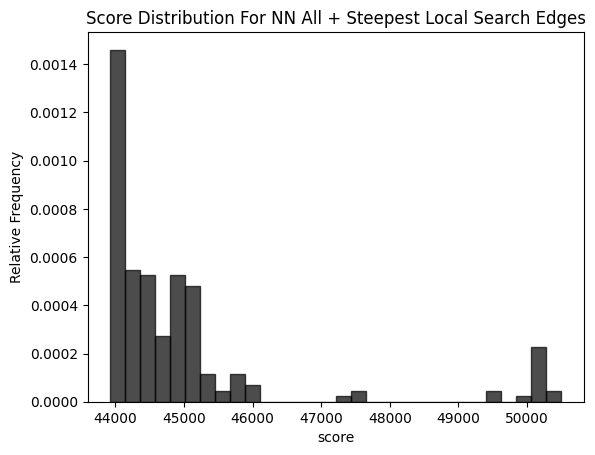

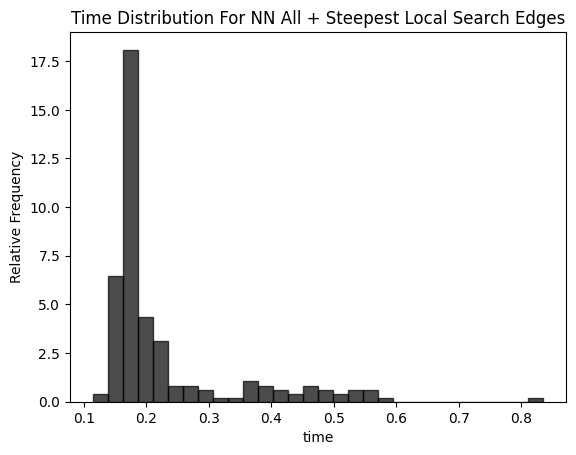

___________________________________________________________________
For Node: 22


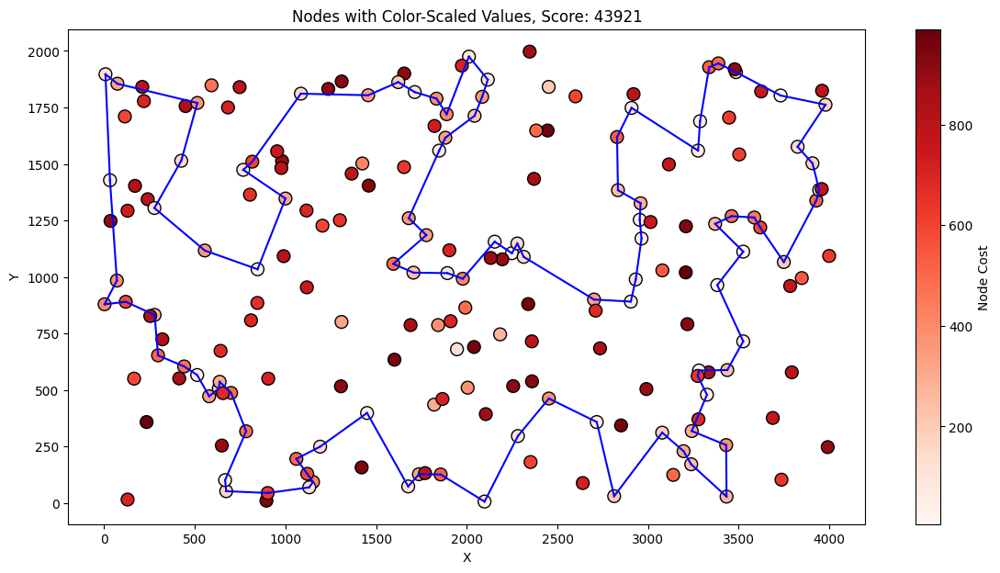

Best solution: [131, 121, 51, 90, 191, 147, 6, 188, 169, 132, 13, 70, 3, 15, 145, 195, 168, 139, 11, 182, 138, 33, 160, 29, 0, 109, 35, 143, 106, 124, 62, 18, 55, 34, 170, 152, 183, 140, 4, 149, 28, 20, 60, 148, 47, 94, 66, 179, 22, 99, 130, 95, 185, 86, 166, 194, 176, 180, 113, 103, 114, 137, 127, 89, 163, 187, 153, 81, 77, 141, 91, 61, 36, 177, 5, 45, 142, 78, 175, 162, 80, 190, 136, 73, 54, 31, 193, 117, 198, 156, 1, 16, 27, 38, 63, 40, 107, 133, 122, 135]
___________________________________________________________________
For Node: 125


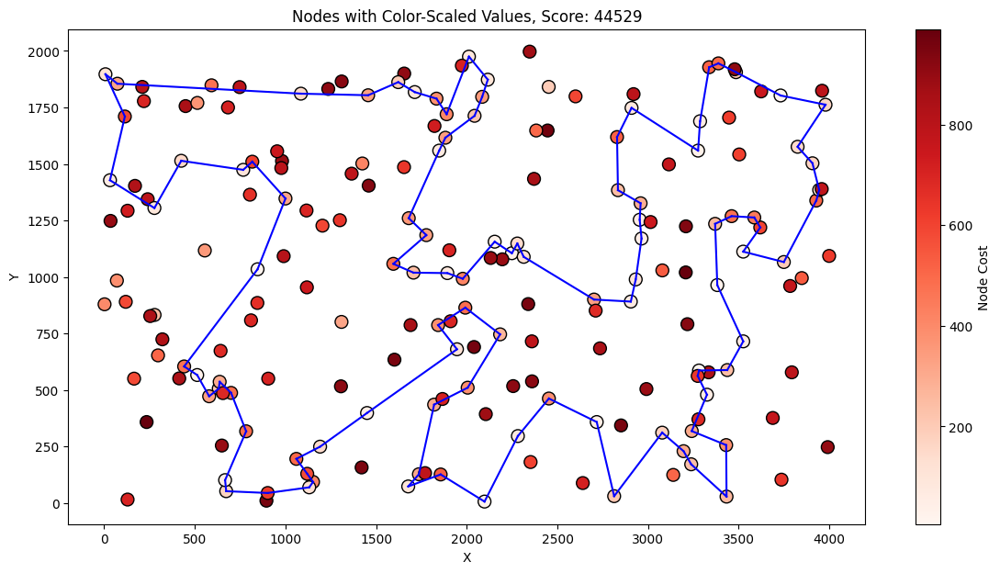

___________________________________________________________________
For Node: 110


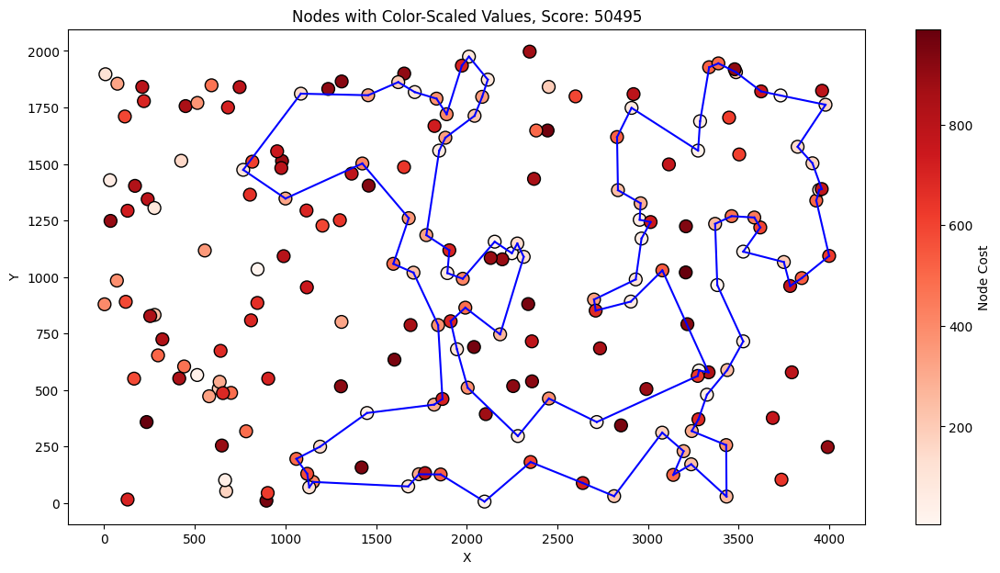

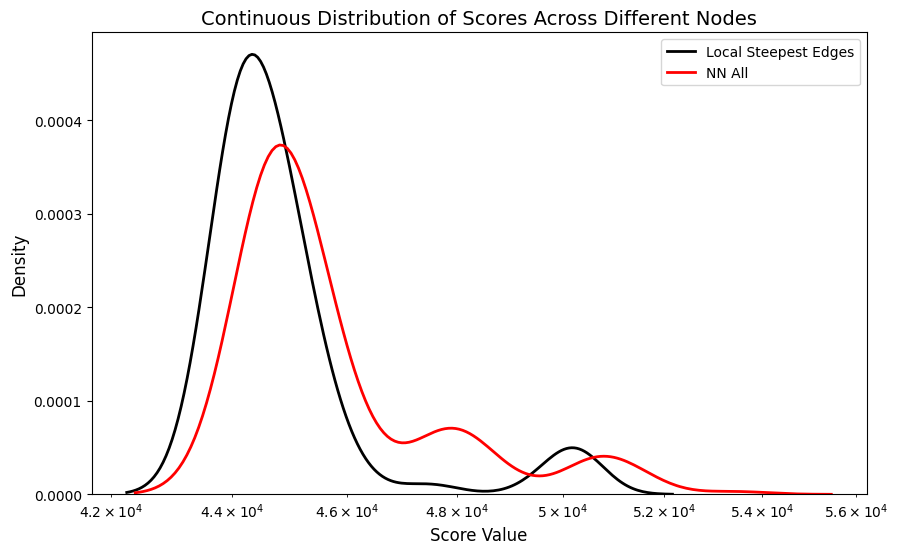

Overall Stats: 
 Minimum: 43921 Maximum: 50495 Median: 44529.0 Mean: 44976.435 Standard Deviation: 1601.63608406373
Time Stats: 
 Minimum: 0.11421823501586914 Maximum: 0.8355967998504639 Median: 0.17748117446899414 Mean: 0.2291027319431305 Standard Deviation: 0.11519811039940277
Comparison Stats: 
 Minimum: 152 Maximum: 5405 Median: 488.0 Mean: 893.82 Standard Deviation: 1018.7148362520298 and Relative: 0.01900546294955016


In [120]:
plot_score_distribution(nn_edges_steepest_local_result_B, label="NN All + Steepest Local Search (Edges)", title = "Score Distribution For NN All + Steepest Local Search Edges", x_label = "score")
plot_score_distribution(nn_edges_steepest_local_times_B, label="Times NN All + Steepest Local Search (Edges)", title = "Time Distribution For NN All + Steepest Local Search Edges", x_label = "time")
plot_best_overall(df_B, nn_edges_steepest_local_solution_B, nn_edges_steepest_local_result_B)
plot_average_overall(df_B, nn_edges_steepest_local_solution_B, nn_edges_steepest_local_result_B)
plot_worst_overall(df_B, nn_edges_steepest_local_solution_B, nn_edges_steepest_local_result_B)
plot_score_distributions(nn_edges_steepest_local_result_B, nn_edges_steepest_local_intermidiate_B, labels = ["Local Steepest Edges", "NN All"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(nn_edges_steepest_local_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(nn_edges_steepest_local_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(nn_edges_steepest_local_intermidiate_B, nn_edges_steepest_local_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

## Comparing Both Instances

In [121]:
def plot_all_distributions(score_dict_1, score_dict_2, score_dict_3, score_dict_4, labels):
    all_scores_1 = []
    for key in score_dict_1.keys():
        item = score_dict_1[key]
        all_scores_1.append(item)

    all_scores_2 = []
    for key in score_dict_2.keys():
        item = score_dict_2[key]
        all_scores_2.append(item)

    all_scores_3 = []
    for key in score_dict_3.keys():
        item = score_dict_3[key]
        all_scores_3.append(item)

    all_scores_4 = []
    for key in score_dict_4.keys():
        item = score_dict_4[key]
        all_scores_4.append(item)
    
    plt.figure(figsize=(18, 12))

    all_scores_1 = np.array(all_scores_1)
    all_scores_2 = np.array(all_scores_2)
    all_scores_3 = np.array(all_scores_3)
    all_scores_4 = np.array(all_scores_4)

    to_plot = [np.mean(all_scores_1), np.mean(all_scores_2), np.mean(all_scores_3), np.mean(all_scores_4)]
    sorted_indices = np.argsort(to_plot)[::-1]
    to_plot_sorted = np.array(to_plot)[sorted_indices]
    labels_sorted = np.array(labels)[sorted_indices]

    # Plotting the bar chart
    plt.figure(figsize=(12, 5))
    plt.yscale('log')
    plt.bar(labels_sorted, to_plot_sorted, color=['blue', 'red', 'green', 'black'])

    # Adding title and labels
    plt.title('Comparison of Mean Scores Across Different TSP Algorithms', fontsize=14)
    plt.xlabel('TSP Algorithms', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Mean Score Logarithmic Scale)', fontsize=12)

<Figure size 1800x1200 with 0 Axes>

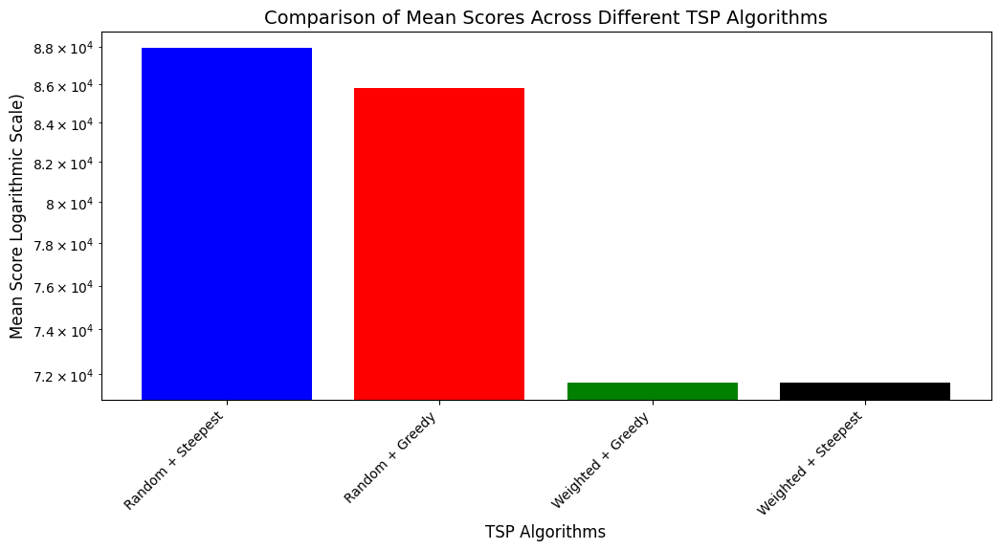

In [122]:
plot_all_distributions(random_greedy_local_result_A, random_steepest_result_A, weighted_greedy_local_result_A, weighted_steepest_result_A, labels = ["Random + Greedy", "Random + Steepest", "Weighted + Greedy", "Weighted + Steepest"])

<Figure size 1800x1200 with 0 Axes>

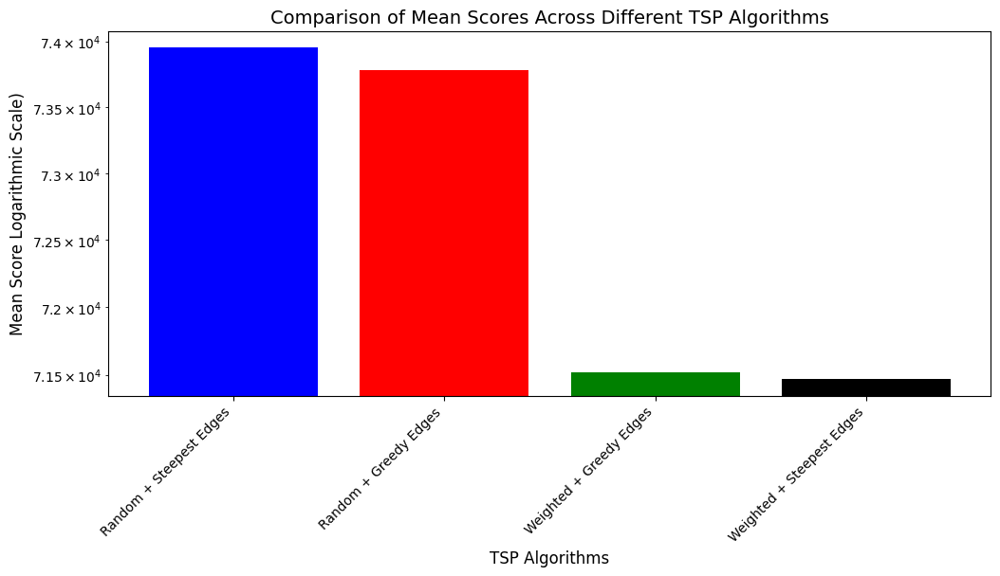

In [123]:
plot_all_distributions(random_edge_greedy_local_result_A, random_edge_steepest_local_result_A, weighted_edges_greedy_local_result_A, weighted_edges_steepest_local_result_A, labels = ["Random + Greedy Edges", "Random + Steepest Edges", "Weighted + Greedy Edges", "Weighted + Steepest Edges"])

<Figure size 1800x1200 with 0 Axes>

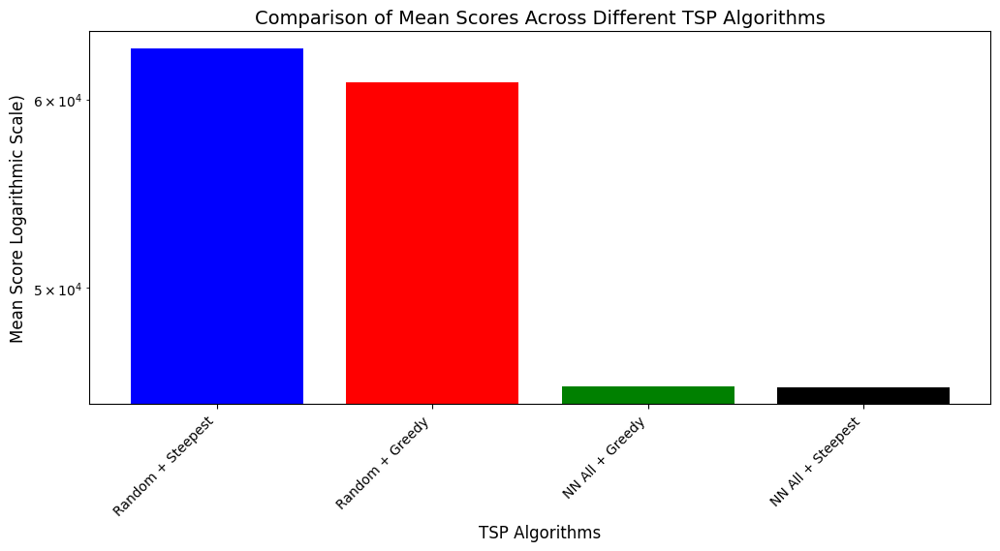

In [124]:
plot_all_distributions(random_greedy_local_result_B, random_steepest_result_B, nn_greedy_local_result_B, nn_steepest_result_B, labels = ["Random + Greedy", "Random + Steepest", "NN All + Greedy", "NN All + Steepest"])

<Figure size 1800x1200 with 0 Axes>

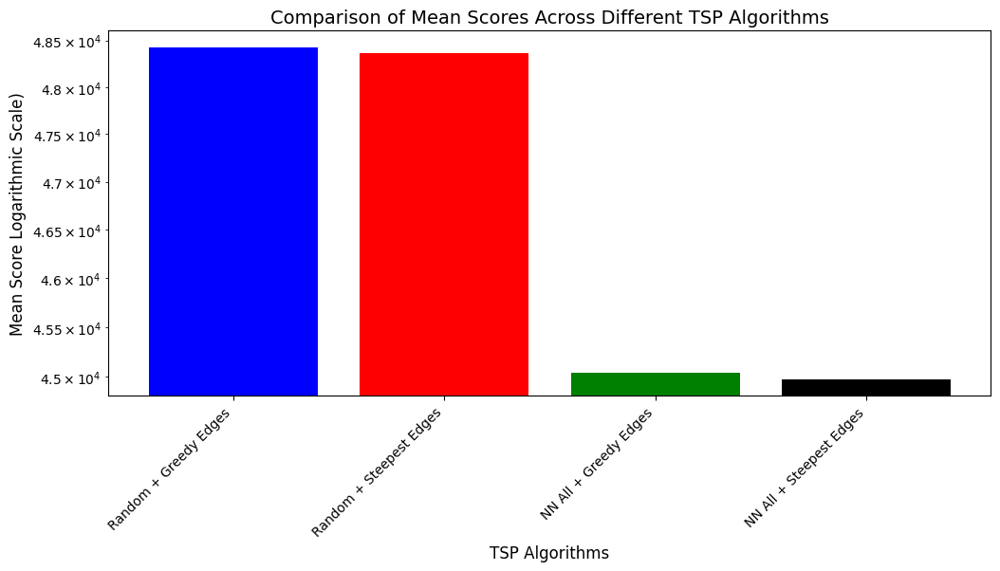

In [125]:
plot_all_distributions(random_edge_greedy_local_result_B, random_edge_steepest_local_result_B, nn_edges_greedy_local_result_B, nn_edges_steepest_local_result_B, labels = ["Random + Greedy Edges", "Random + Steepest Edges", "NN All + Greedy Edges", "NN All + Steepest Edges"])